# 2026-08-19 Initial Check: rSFMS and rMZR within one effective radius

This notebook is a dated copy of `20260813_initial_check_rSFMS_rMZR_galaxy.ipynb`.
It preserves the original product discovery, masks, relations, colours, and plotting layout,
with one additional mandatory spatial selection: only spaxels inside each galaxy's projected
one-effective-radius ellipse are used.


## Setup copied from the source notebook

These cells use only galaxies/products discovered below the current `further` run directory.
The complete 40-galaxy MAUVE parent sample is retained in the effective-radius catalogue even
when a galaxy does not yet have a science-ready `further` product. Infall-stage and fixed-galaxy
colour conventions are otherwise unchanged from the source notebook.


In [1]:
# Combined further-project initial checks using current further products only.
# The active science sample is: all currently science-ready `further` products.
# Downstream cells keep using the same helper names as the 20260525 notebook.

from __future__ import annotations

import math
import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from IPython.display import display

PROJECT_ROOT = Path.cwd().resolve()
RUN_LABEL = "v3tk_v7.6.8"
RUN_DIR = PROJECT_ROOT / RUN_LABEL
OUTDIR = PROJECT_ROOT / "quicklook_figures_further"

KEY_LINES = [
    "HB4861",
    "OIII5006",
    "HA6562",
    "NII6583",
    "SII6716",
    "SII6730",
    "SIII6312",
    "OII7318",
    "OII7319",
    "OII7329",
    "OII7330",
]

plt.style.use("default")
mpl.rcParams.update({
    "figure.dpi": 120,
    "font.size": 10,
    "axes.grid": False,
})

print(f"Project root: {PROJECT_ROOT}")
print(f"Current further run directory: {RUN_DIR}")
print("Active PRODUCT paths use current `further` products only.")
print("Active save paths are intentionally commented out in this notebook.")

Project root: /Users/Igniz/Desktop/ICRAR/further
Current further run directory: /Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8
Active PRODUCT paths use current `further` products only.
Active save paths are intentionally commented out in this notebook.


In [2]:
def first_existing(*paths: Path | None) -> Path | None:
    for path in paths:
        if path is not None and path.exists():
            return path
    return None


def fits_has_hdus(path: Path | None, names: list[str]) -> bool:
    if path is None or not Path(path).exists():
        return False
    try:
        with fits.open(path, memmap=True) as hdul:
            hdu_names = {h.name.upper() for h in hdul}
        return all(name.upper() in hdu_names for name in names)
    except Exception:
        return False


def align_map_to_shape(map_data, target_shape, *, label="map", fill_value=np.nan, max_delta=2):
    """Align a nearly matching 2D map to target_shape by copying the overlap."""
    target_shape = tuple(target_shape)
    arr = np.asarray(map_data, dtype=float)
    if arr.shape == target_shape:
        return arr
    if arr.ndim != len(target_shape):
        raise ValueError(f"{label}: cannot align ndim {arr.ndim} to target shape {target_shape}")

    deltas = tuple(abs(src - dst) for src, dst in zip(arr.shape, target_shape))
    if any(delta > max_delta for delta in deltas):
        raise ValueError(f"{label}: shape {arr.shape} differs too much from target {target_shape}")

    aligned = np.full(target_shape, fill_value, dtype=float)
    overlap = tuple(min(src, dst) for src, dst in zip(arr.shape, target_shape))
    slices = tuple(slice(0, n) for n in overlap)
    aligned[slices] = arr[slices]
    print(f"  {label}: aligned shape {arr.shape} -> {target_shape}; overlap={overlap}")
    return aligned


def intrinsic_sigma_from_maps(sigma_obs, sigma_corr, *, label="sigma"):
    """Return intrinsic sigma = sqrt(SIGMA^2 - SIGMA_CORR^2), masking nonphysical pixels."""
    if sigma_obs is None or sigma_corr is None:
        return None
    sigma_obs = np.asarray(sigma_obs, dtype=float)
    sigma_corr = align_map_to_shape(sigma_corr, sigma_obs.shape, label=f"{label} correction")
    sigma2_intrinsic = sigma_obs**2 - sigma_corr**2
    sigma_intrinsic = np.full(sigma_obs.shape, np.nan, dtype=float)
    ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    sigma_intrinsic[ok] = np.sqrt(sigma2_intrinsic[ok])
    return sigma_intrinsic


def discover_further_products(run_dir: Path = RUN_DIR) -> pd.DataFrame:
    rows = []
    if not run_dir.exists():
        raise FileNotFoundError(f"Missing run directory: {run_dir}")

    for gal_dir in sorted(
        p for p in run_dir.iterdir()
        if p.is_dir() and not p.name.endswith("_logs")
    ):
        gal = gal_dir.name
        spatial_raw = gal_dir / f"{gal}_spatial_binning_maps.fits"
        spatial_further = gal_dir / f"{gal}_spatial_binning_maps_further.fits"
        gas_raw_lower = gal_dir / f"{gal}_gas_bin_maps.fits"
        gas_raw_upper = gal_dir / f"{gal}_gas_BIN_maps.fits"
        gas_further_lower = gal_dir / f"{gal}_gas_bin_maps_further.fits"
        gas_further_upper = gal_dir / f"{gal}_gas_BIN_maps_further.fits"
        sfh = gal_dir / f"{gal}_sfh_maps.fits"
        sfh_weights = gal_dir / f"{gal}_sfh_weights.fits"
        kin = gal_dir / f"{gal}_kin_maps.fits"
        gas_spaxel = gal_dir / f"{gal}_gas_spaxel_maps.fits"
        mask = gal_dir / f"{gal}_mask.fits"

        spatial_preferred = first_existing(spatial_further, spatial_raw)
        gas_preferred = first_existing(gas_further_lower, gas_further_upper, gas_raw_lower, gas_raw_upper)

        rows.append({
            "galaxy": gal,
            "folder": gal_dir,
            "spatial_path": spatial_preferred,
            "gas_path": gas_preferred,
            "ew_path": first_existing(gal_dir / f"{gal}_proxy_EW_maps_further.fits", gal_dir / f"{gal}_proxy_EW_maps.fits"),
            "sfh_path": sfh if sfh.exists() else None,
            "sfh_weights_path": sfh_weights if sfh_weights.exists() else None,
            "kin_path": kin if kin.exists() else None,
            "gas_spaxel_path": gas_spaxel if gas_spaxel.exists() else None,
            "mask_path": mask if mask.exists() else None,
            "sfr_log_path": first_existing(RUN_DIR / "sfr_logs" / f"{gal}.log"),
            "mass_log_path": first_existing(RUN_DIR / "mass_logs" / f"{gal}.log"),
            "source": "further",
            "has_spatial": spatial_preferred is not None,
            "has_gas": gas_preferred is not None,
            "has_sfh": sfh.exists(),
            "has_sfh_weights": sfh_weights.exists(),
            "has_kin": kin.exists(),
            "has_gas_spaxel": gas_spaxel.exists(),
            "has_mask": mask.exists(),
            "has_spatial_further": spatial_further.exists(),
            "has_gas_further": gas_further_lower.exists() or gas_further_upper.exists(),
        })

    table = pd.DataFrame(rows).set_index("galaxy", drop=False)
    if table.empty:
        raise RuntimeError(f"No galaxy folders found below {run_dir}")

    table["has_mass_map"] = [fits_has_hdus(path, ["LOGMASS_SURFACE_DENSITY"]) for path in table["spatial_path"]]
    table["has_sfr_map"] = [fits_has_hdus(path, ["LOGSFR_SURFACE_DENSITY_HII", "LOGSFR_SURFACE_DENSITY_SF"]) for path in table["gas_path"]]
    table["has_o3n2_m13"] = [fits_has_hdus(path, ["O_H_O3N2_M13_HII", "O_H_O3N2_M13_SF"]) for path in table["gas_path"]]
    table["has_proxy_ew"] = table["ew_path"].notna()
    table["ready_physics_maps"] = table["has_mass_map"] & table["has_sfr_map"] & table["has_o3n2_m13"]
    table["ready_raw_gas_qc"] = table["has_spatial"] & table["has_gas"]
    table["ready_sfh_qc"] = table["has_spatial"] & table["has_sfh"]
    return table



CURRENT_PRODUCTS = discover_further_products()

CURRENT_READY_PHYSICS_GALAXIES = CURRENT_PRODUCTS.index[CURRENT_PRODUCTS["ready_physics_maps"]].tolist()
CURRENT_NOT_PHYSICS_READY = CURRENT_PRODUCTS.index[~CURRENT_PRODUCTS["ready_physics_maps"]].tolist()

FAKE_GALAXIES = []
UNREUSABLE_MISSING_GALAXIES = CURRENT_NOT_PHYSICS_READY

PRODUCTS = CURRENT_PRODUCTS.copy()
PRODUCTS["source"] = "further_ready"
PRODUCTS.loc[~PRODUCTS["ready_physics_maps"], "source"] = "further_not_science_ready"
PRODUCTS["fake_reason"] = ""
PRODUCTS.loc[UNREUSABLE_MISSING_GALAXIES, "fake_reason"] = "kept for inventory/QC only; not science-ready in current further products"

ANALYSIS_GALAXIES = CURRENT_READY_PHYSICS_GALAXIES
QC_GALAXIES = PRODUCTS.index[PRODUCTS["ready_raw_gas_qc"]].tolist()
SFH_QC_GALAXIES = PRODUCTS.index[PRODUCTS["ready_sfh_qc"]].tolist()
DISPLAY_COLUMNS = [
    "source",
    "has_spatial",
    "has_gas",
    "has_mass_map",
    "has_sfr_map",
    "has_o3n2_m13",
    "has_proxy_ew",
    "has_sfh",
    "has_sfh_weights",
    "has_kin",
    "has_gas_spaxel",
    "has_mask",
    "spatial_path",
    "gas_path",
    "ew_path",
    "sfr_log_path",
    "mass_log_path",
    "fake_reason",
]

print(f"Discovered current galaxy folders: {len(CURRENT_PRODUCTS)}")
print(f"Science-ready current further galaxies: {len(CURRENT_READY_PHYSICS_GALAXIES)}")
print(f"Not science-ready current further galaxies: {len(CURRENT_NOT_PHYSICS_READY)}")
print("Extended fallback galaxies: 0 (disabled; using current further products only)")
print("Analysis galaxies:", ", ".join(ANALYSIS_GALAXIES))
print("Current not-science-ready galaxies:", ", ".join(UNREUSABLE_MISSING_GALAXIES) if UNREUSABLE_MISSING_GALAXIES else "none")
display(PRODUCTS[DISPLAY_COLUMNS])

def further_spatial_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "spatial_path"]
    if path is None:
        raise FileNotFoundError(f"No spatial product registered for {galaxy}")
    return Path(path)


def further_gas_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "gas_path"]
    if path is None:
        raise FileNotFoundError(f"No gas product registered for {galaxy}")
    return Path(path)


def further_ew_path(galaxy: str, suffix: str | None = None) -> Path:
    if galaxy in PRODUCTS.index and PRODUCTS.loc[galaxy, "ew_path"] is not None:
        return Path(PRODUCTS.loc[galaxy, "ew_path"])

    suffixes = []
    if suffix:
        suffixes.append(suffix)
    suffixes.extend(["_proxy_EW_maps.fits", "_proxy_EW_maps_further.fits", "_pseudo_EW_maps.fits"])
    candidates = []
    for suffix_item in dict.fromkeys(suffixes):
        candidates.append(RUN_DIR / galaxy / f"{galaxy}{suffix_item}")
        candidates.append(PROJECT_ROOT / f"{galaxy}{suffix_item}")
    found = first_existing(*candidates)
    if found is None:
        checked = "\n".join(f"  - {path}" for path in candidates)
        raise FileNotFoundError(f"No EW product found for {galaxy}. Checked:\n{checked}")
    return found


def sfr_log_path(galaxy: str) -> Path | None:
    if galaxy in PRODUCTS.index:
        path = PRODUCTS.loc[galaxy, "sfr_log_path"]
        return None if path is None else Path(path)
    return first_existing(RUN_DIR / "sfr_logs" / f"{galaxy}.log")


def mass_log_path(galaxy: str) -> Path | None:
    if galaxy in PRODUCTS.index:
        path = PRODUCTS.loc[galaxy, "mass_log_path"]
        return None if path is None else Path(path)
    return first_existing(RUN_DIR / "mass_logs" / f"{galaxy}.log")


def physics_ready_galaxies(require_ew: bool = True) -> list[str]:
    galaxies = PRODUCTS.index[PRODUCTS["ready_physics_maps"]].tolist()
    if require_ew:
        galaxies = [gal for gal in galaxies if PRODUCTS.loc[gal, "has_proxy_ew"]]
    return galaxies


def old_paper_cells_ready(require_ew: bool = True) -> bool:
    return len(physics_ready_galaxies(require_ew=require_ew)) > 0


COMBINED_GALAXY_COMPONENTS = {
    "NGC4567_8": ("NGC4567", "NGC4568"),
}


def add_combined_infall_classes(infall_classes: dict[str, int]) -> dict[str, int]:
    """Assign a combined product only when all components share one stage."""
    resolved = dict(infall_classes)
    for combined_id, components in COMBINED_GALAXY_COMPONENTS.items():
        missing = [component for component in components if component not in resolved]
        if missing:
            raise KeyError(
                f"Cannot classify {combined_id}: missing components {', '.join(missing)}"
            )
        component_stages = {resolved[component] for component in components}
        if len(component_stages) != 1:
            details = ", ".join(
                f"{component}=stage {resolved[component]}" for component in components
            )
            raise ValueError(f"Cannot classify {combined_id}: {details}")
        resolved[combined_id] = component_stages.pop()
    return resolved




Discovered current galaxy folders: 35
Science-ready current further galaxies: 35
Not science-ready current further galaxies: 0
Extended fallback galaxies: 0 (disabled; using current further products only)
Analysis galaxies: IC3392, NGC4064, NGC4189, NGC4192, NGC4222, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4321, NGC4330, NGC4351, NGC4380, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4424, NGC4450, NGC4457, NGC4501, NGC4522, NGC4535, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4654, NGC4694, NGC4698
Current not-science-ready galaxies: none


,source,has_spatial,has_gas,has_mass_map,has_sfr_map,has_o3n2_m13,has_proxy_ew,has_sfh,has_sfh_weights,has_kin,has_gas_spaxel,has_mask,spatial_path,gas_path,ew_path,sfr_log_path,mass_log_path,fake_reason
galaxy,,,,,,,,,,,,,,,,,,
IC3392,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4064,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4189,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4192,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4222,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4254,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4293,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4294,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,
NGC4298,further_ready,True,True,True,True,True,True,True,True,True,False,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,


## One-effective-radius aperture and provenance

This copy keeps the original workflow and plotting design, but every spaxel used in the
BPT, rSFMS, and rMZR analysis must also lie inside the projected ellipse at one effective
radius of its galaxy.

Source policy and limitations:

- **Preferred if complete:** NGVS (g)-band curve-of-growth (R_e). The final NGVS-II
  catalogue defines a geometric curve-of-growth half-light radius, but the published
  footprint contains only 35 of the 40 MAUVE parent targets. It is therefore not used for
  a mixed, full-sample aperture definition.
- **Adopted for 39/40:** the live GOLDMine empirical near-IR `HEMPRE` radius, retrieved
  2026-08-19. Despite the historical field name and glossary shorthand, its primary catalogue
  contains both H and K-prime observations; the exact source filter is retained in the CSV.
  K-prime profiles were shifted to an H-equivalent surface-brightness zero point, but no
  wavelength-dependent size conversion was applied. The radius is the empirical half-light
  radius along the fitted ellipse semimajor axis, with a quoted typical uncertainty of
  0.05 dex in log radius. Some live values differ from the immutable 2000 VizieR table, so the
  live API is recorded as the numeric-value source. NGC4222's original filter remains unknown;
  NGC4424's H filter is independently confirmed.
- **Required exception:** GOLDMine has no radius for NGC4064. For that galaxy only, the
  published VERTICO IV stellar half-mass radius (R_{e,*}=4.27\pm1.05) kpc is used.
- Galaxy centers come from the public SIMBAD basic-position fields, retrieved 2026-08-11,
  as recorded in the local `Brown2021Table1.txt`. SIMBAD's underlying coordinate reference
  and wavelength vary by object. SDSS-(r) inclinations and position angles retain the
  Brown et al. (2021) values. Brown et al. used an intrinsic disk ratio (q_0=0.2); the
  observed projected ratio is
  reconstructed as
  (q=b/a=[q_0^2+(1-q_0^2)\cos^2 i]^{1/2}).
- The physical scale is frozen at **16.5 Mpc**. Each aperture uses
  (a=R_e), (b=qR_e), and PA east of north. For `NGC4567_8`, the accepted area is the
  union of the separate NGC4567 and NGC4568 ellipses.

The complete 40-galaxy aperture table is `MAUVE_effective_radii.csv`; its center
columns mirror `Brown2021Table1.txt`, which the code reloads and validates at runtime.
References: [NGVS-II](https://arxiv.org/abs/2607.18414),
[GOLDMine](http://goldmine.inaf.it/),
[Gavazzi et al. 2000](https://ui.adsabs.harvard.edu/abs/2000A%26A...361..863G),
[Gavazzi et al. 2002](https://doi.org/10.1046/j.1365-8711.2002.05206.x),
[Brown et al. 2021](https://doi.org/10.3847/1538-4365/ac28f5), and
[Villanueva et al. 2022](https://doi.org/10.3847/1538-4357/ac9d3c).


In [3]:
from astropy.wcs import WCS

RE_CATALOGUE_PATH = PROJECT_ROOT / "MAUVE_effective_radii.csv"
SIMBAD_CENTRE_TABLE_PATH = PROJECT_ROOT / "Brown2021Table1.txt"
VIRGO_DISTANCE_MPC = 16.5
KPC_PER_ARCSEC_16P5 = VIRGO_DISTANCE_MPC * 1000.0 * np.deg2rad(1.0 / 3600.0)

def load_simbad_centres_from_brown_table(path):
    """Read the SIMBAD-refreshed J2000 centers recorded in Brown2021Table1.txt."""
    records = []
    for line in path.read_text().splitlines():
        fields = line.split("\t")
        if len(fields) < 3:
            continue
        name_match = re.match(r"(IC|NGC|VCC)\s+(\d+)", fields[0])
        if name_match is None:
            continue
        galaxy = "".join(name_match.groups())
        ra_match = re.fullmatch(
            r"(\d+)\^h(\d+)\^m([\d.]+)", fields[1].replace(".s", ".")
        )
        dec_match = re.fullmatch(
            r"([+-]?\d+)deg(\d+)'([\d.]+)", fields[2].replace('."', ".")
        )
        if ra_match is None or dec_match is None:
            raise ValueError(f"Cannot parse SIMBAD center for {galaxy}: {fields[1:3]}")
        ra_h, ra_m, ra_s = map(float, ra_match.groups())
        dec_d, dec_m, dec_s = map(float, dec_match.groups())
        dec_sign = -1.0 if dec_d < 0 else 1.0
        records.append({
            "galaxy": galaxy,
            "simbad_center_ra_deg": 15.0 * (ra_h + ra_m / 60.0 + ra_s / 3600.0),
            "simbad_center_dec_deg": dec_sign * (abs(dec_d) + dec_m / 60.0 + dec_s / 3600.0),
        })
    centers = pd.DataFrame.from_records(records)
    if centers.empty or centers["galaxy"].duplicated().any():
        raise RuntimeError(f"Invalid or duplicate center rows in {path}")
    return centers


RE_CATALOGUE = pd.read_csv(RE_CATALOGUE_PATH)
required_re_columns = {
    "galaxy", "notebook_product_id", "adopted_re_source", "center_ra_deg",
    "center_dec_deg", "pa_deg_east_of_north", "a_re_kpc", "b_re_kpc",
    "distance_mpc",
}
missing_re_columns = sorted(required_re_columns - set(RE_CATALOGUE.columns))
if missing_re_columns:
    raise KeyError(f"Missing effective-radius table columns: {missing_re_columns}")
if len(RE_CATALOGUE) != 40 or RE_CATALOGUE["galaxy"].nunique() != 40:
    raise RuntimeError("Effective-radius table must contain one row for each of 40 MAUVE galaxies")
if not np.allclose(RE_CATALOGUE["distance_mpc"], VIRGO_DISTANCE_MPC):
    raise ValueError("Effective-radius table does not consistently use the assumed 16.5 Mpc distance")

SIMBAD_CENTRES = load_simbad_centres_from_brown_table(SIMBAD_CENTRE_TABLE_PATH)
RE_CATALOGUE = RE_CATALOGUE.merge(SIMBAD_CENTRES, on="galaxy", how="left", validate="one_to_one")
if RE_CATALOGUE[["simbad_center_ra_deg", "simbad_center_dec_deg"]].isna().any().any():
    missing_centres = RE_CATALOGUE.loc[
        RE_CATALOGUE["simbad_center_ra_deg"].isna(), "galaxy"
    ].tolist()
    raise RuntimeError(f"Missing SIMBAD centers in {SIMBAD_CENTRE_TABLE_PATH.name}: {missing_centres}")
csv_centres = RE_CATALOGUE[["center_ra_deg", "center_dec_deg"]].to_numpy(dtype=float)
simbad_centres = RE_CATALOGUE[["simbad_center_ra_deg", "simbad_center_dec_deg"]].to_numpy(dtype=float)
if not np.allclose(csv_centres, simbad_centres, rtol=0.0, atol=5e-8):
    raise RuntimeError(
        f"Center columns in {RE_CATALOGUE_PATH.name} are not synchronized with "
        f"{SIMBAD_CENTRE_TABLE_PATH.name}"
    )
RE_CATALOGUE[["center_ra_deg", "center_dec_deg"]] = simbad_centres

RE_ROWS_BY_GALAXY = RE_CATALOGUE.set_index("galaxy", drop=False)
_RE_MASK_CACHE = {}
RE_MASK_AUDIT = {}


def product_re_components(product_id):
    """Return physical galaxy components used to construct one product aperture."""
    return COMBINED_GALAXY_COMPONENTS.get(product_id, (product_id,))


def _wcs_cache_signature(header):
    keys = (
        "CTYPE1", "CTYPE2", "CRPIX1", "CRPIX2", "CRVAL1", "CRVAL2",
        "CDELT1", "CDELT2", "CD1_1", "CD1_2", "CD2_1", "CD2_2",
        "PC1_1", "PC1_2", "PC2_1", "PC2_2",
    )
    return tuple(header.get(key) for key in keys)


def _tangent_offsets_arcsec(ra_deg, dec_deg, center_ra_deg, center_dec_deg):
    """Exact gnomonic east/north offsets about a component center."""
    ra = np.deg2rad(ra_deg)
    dec = np.deg2rad(dec_deg)
    ra0 = np.deg2rad(float(center_ra_deg))
    dec0 = np.deg2rad(float(center_dec_deg))
    dra = (ra - ra0 + np.pi) % (2.0 * np.pi) - np.pi
    cos_c = np.sin(dec0) * np.sin(dec) + np.cos(dec0) * np.cos(dec) * np.cos(dra)
    with np.errstate(divide="ignore", invalid="ignore"):
        east = np.cos(dec) * np.sin(dra) / cos_c
        north = (
            np.cos(dec0) * np.sin(dec)
            - np.sin(dec0) * np.cos(dec) * np.cos(dra)
        ) / cos_c
    factor = np.rad2deg(1.0) * 3600.0
    return east * factor, north * factor


def effective_radius_mask_for_product(product_id, target_shape, celestial_header):
    """Projected union of all component ellipses at R <= R_e on a FITS WCS grid."""
    target_shape = tuple(target_shape)
    cache_key = (product_id, target_shape, _wcs_cache_signature(celestial_header))
    if cache_key in _RE_MASK_CACHE:
        return _RE_MASK_CACHE[cache_key]

    components = tuple(product_re_components(product_id))
    missing_components = [name for name in components if name not in RE_ROWS_BY_GALAXY.index]
    if missing_components:
        raise KeyError(f"No effective-radius rows for {product_id}: {missing_components}")

    wcs = WCS(celestial_header).celestial
    if not wcs.has_celestial:
        raise ValueError(f"No celestial WCS available for {product_id}")
    yy, xx = np.indices(target_shape, dtype=float)
    ra_deg, dec_deg = wcs.pixel_to_world_values(xx, yy)
    inside_union = np.zeros(target_shape, dtype=bool)

    for component in components:
        row = RE_ROWS_BY_GALAXY.loc[component]
        east_arcsec, north_arcsec = _tangent_offsets_arcsec(
            ra_deg, dec_deg, row["center_ra_deg"], row["center_dec_deg"]
        )
        east_kpc = east_arcsec * KPC_PER_ARCSEC_16P5
        north_kpc = north_arcsec * KPC_PER_ARCSEC_16P5
        pa_rad = np.deg2rad(float(row["pa_deg_east_of_north"]))
        major_kpc = east_kpc * np.sin(pa_rad) + north_kpc * np.cos(pa_rad)
        minor_kpc = east_kpc * np.cos(pa_rad) - north_kpc * np.sin(pa_rad)
        ellipse_r2 = (
            (major_kpc / float(row["a_re_kpc"])) ** 2
            + (minor_kpc / float(row["b_re_kpc"])) ** 2
        )
        inside_union |= np.isfinite(ellipse_r2) & (ellipse_r2 <= 1.0)

    _RE_MASK_CACHE[cache_key] = inside_union
    RE_MASK_AUDIT[product_id] = {
        "components": components,
        "shape": target_shape,
        "pixels_within_re": int(inside_union.sum()),
        "fraction_of_map": float(inside_union.mean()),
    }
    return inside_union


parent_sample_names = [
    line.split()[0]
    for line in (PROJECT_ROOT / "mauve_master_wiki_newclass.dat").read_text().splitlines()
    if line.strip() and not line.startswith("#")
]
if set(parent_sample_names) != set(RE_CATALOGUE["galaxy"]):
    raise RuntimeError("Effective-radius table does not match the live 40-galaxy MAUVE parent sample")

active_re_components = {
    component
    for product_id in ANALYSIS_GALAXIES
    for component in product_re_components(product_id)
}
missing_active_re = sorted(active_re_components - set(RE_CATALOGUE["galaxy"]))
if missing_active_re:
    raise RuntimeError(f"Missing radius rows for active analysis components: {missing_active_re}")

print(f"Loaded effective-radius catalogue: {RE_CATALOGUE_PATH.name} ({len(RE_CATALOGUE)} galaxies)")
print(f"Galaxy centers: SIMBAD positions from {SIMBAD_CENTRE_TABLE_PATH.name}")
print("R_e source adoption:", RE_CATALOGUE["adopted_re_source"].value_counts().to_dict())
print(f"Assumed distance: {VIRGO_DISTANCE_MPC:.1f} Mpc ({KPC_PER_ARCSEC_16P5:.5f} kpc/arcsec)")
display(RE_CATALOGUE[[
    "galaxy", "notebook_product_id", "ngvs_footprint_covered",
    "goldmine_nir_re_arcsec", "source_filter", "adopted_re_source",
    "adopted_re_value_source", "adopted_re_typical_uncertainty_dex",
    "a_re_arcsec", "b_re_arcsec", "a_re_kpc", "b_re_kpc",
    "pa_deg_east_of_north",
]])


Loaded effective-radius catalogue: MAUVE_effective_radii.csv (40 galaxies)
Galaxy centers: SIMBAD positions from Brown2021Table1.txt
R_e source adoption: {'GOLDMine live HEMPRE': 39, 'VERTICO IV stellar half-mass radius': 1}
Assumed distance: 16.5 Mpc (0.07999 kpc/arcsec)


,galaxy,notebook_product_id,ngvs_footprint_covered,goldmine_nir_re_arcsec,source_filter,adopted_re_source,adopted_re_value_source,adopted_re_typical_uncertainty_dex,a_re_arcsec,b_re_arcsec,a_re_kpc,b_re_kpc,pa_deg_east_of_north
0,NGC4189,NGC4189,True,35.16,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,35.160000,26.549261,2.812598,2.123788,70
1,NGC4192,NGC4192,True,109.70,K-prime,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,109.700000,25.552813,8.775370,2.044078,153
2,NGC4222,NGC4222,True,29.19,unknown,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,29.190000,5.838000,2.335032,0.467006,58
3,NGC4254,NGC4254,True,48.02,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,48.020000,37.804814,3.841324,3.024168,63
4,NGC4294,NGC4294,True,33.73,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,33.730000,11.335333,2.698206,0.906762,151
5,NGC4321,NGC4321,True,111.76,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,111.760000,95.515130,8.940158,7.640662,100
6,NGC4351,NGC4351,True,29.14,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,29.140000,19.973686,2.331033,1.597780,71
7,NGC4383,NGC4383,True,13.66,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,13.660000,7.967292,1.092722,0.637338,17
8,NGC4396,NGC4396,True,52.49,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,52.490000,12.226683,4.198899,0.978064,124
9,NGC4535,NGC4535,True,74.17,H,GOLDMine live HEMPRE,"GOLDMine live API HEMPRE, retrieved 2026-08-19",0.05,74.170000,50.838995,5.933174,4.066828,12


R_e inspection grid: 36/40 galaxies have current stellar-mass maps


,galaxy,map_product,boundary_galaxy,map_available,sfr_overlay_available,pixels_within_re,finite_mass_pixels_within_re,hii_ew_sigma_pixels
0,NGC4189,NGC4189,NGC4189,True,True,73091,72390,96364
1,NGC4192,NGC4192,NGC4192,True,True,220163,220061,144333
2,NGC4222,NGC4222,NGC4222,True,True,13382,13382,42249
3,NGC4254,NGC4254,NGC4254,True,True,142583,142583,661964
4,NGC4294,NGC4294,NGC4294,True,True,30031,30031,68833
5,NGC4321,NGC4321,NGC4321,True,True,832262,775102,454144
6,NGC4351,NGC4351,NGC4351,True,True,45696,45696,30711
7,NGC4383,NGC4383,NGC4383,True,True,8543,8543,25212
8,NGC4396,NGC4396,NGC4396,True,True,50416,50416,85378
9,NGC4535,NGC4535,NGC4535,True,True,294626,290522,187113


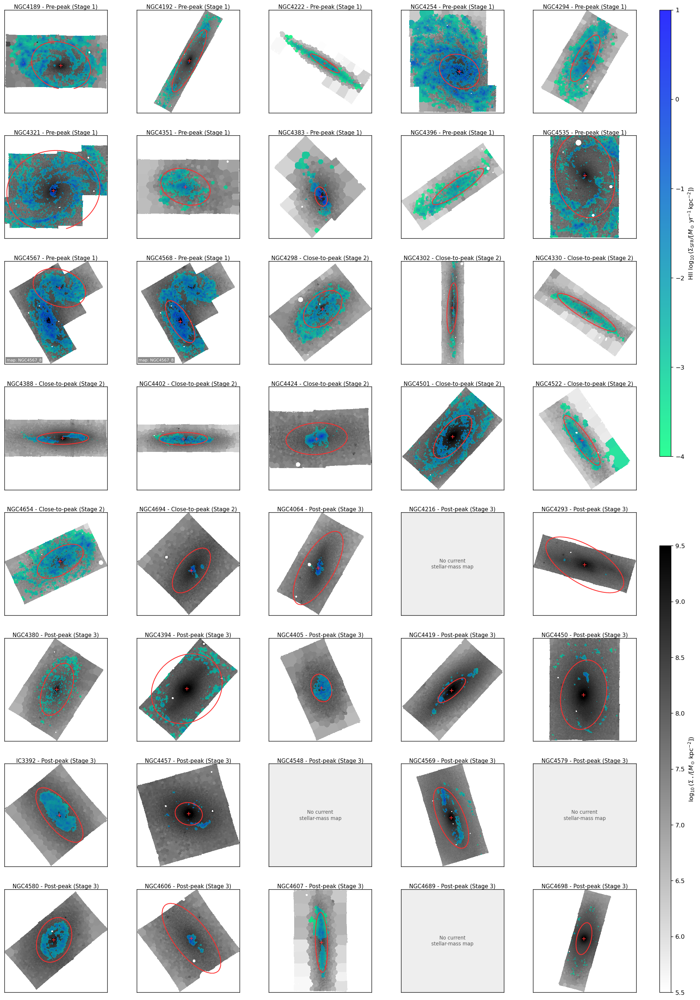

In [4]:
# Visual inspection of all 40 projected one-R_e apertures on stellar-mass maps,
# with final-selection HII-region SFR overlaid (EW(Halpha)>6 A and sigma_Halpha<45 km/s).
# The grid follows the 40-row parent-sample order in the effective-radius table.
# Four parent galaxies without current `further` stellar-mass products are retained
# as explicit blank panels. NGC4567 and NGC4568 use their shared NGC4567_8 map,
# but each panel overlays only that physical component's adopted R_e ellipse.

MASS_MAP_HDU = "LOGMASS_SURFACE_DENSITY"
MASS_MAP_VMIN = 5.5
MASS_MAP_VMAX = 9.5
SFR_MAP_VMIN = -4.0
SFR_MAP_VMAX = 1.0
SFR_EW_MIN = 6.0
SFR_SIGMA_MAX = 45.0
mass_map_norm = mpl.colors.Normalize(vmin=MASS_MAP_VMIN, vmax=MASS_MAP_VMAX)
sfr_map_norm = mpl.colors.Normalize(vmin=SFR_MAP_VMIN, vmax=SFR_MAP_VMAX)
sfr_map_cmap = mpl.colormaps["winter_r"].copy()
sfr_map_cmap.set_bad((0.0, 0.0, 0.0, 0.0))

mass_map_figure = plt.figure(figsize=(16, 23), constrained_layout=False)
mass_map_grid = mass_map_figure.add_gridspec(
    8, 6, width_ratios=[1, 1, 1, 1, 1, 0.10]
)
mass_map_axes = np.asarray([
    [mass_map_figure.add_subplot(mass_map_grid[row, column]) for column in range(5)]
    for row in range(8)
])
colorbar_grid = mass_map_grid[:, 5].subgridspec(2, 1, hspace=0.20)
sfr_map_colorbar_axis = mass_map_figure.add_subplot(colorbar_grid[0, 0])
mass_map_colorbar_axis = mass_map_figure.add_subplot(colorbar_grid[1, 0])
mass_map_figure.subplots_adjust(
    left=0.025, right=0.975, bottom=0.02, top=0.985,
    wspace=0.18, hspace=0.22,
)
mass_map_image = None
sfr_map_image = None
re_visual_audit_rows = []
INFALL_STAGE_NAMES = {
    1: "Pre-peak",
    2: "Close-to-peak",
    3: "Post-peak",
}

for axis, (_, re_row) in zip(mass_map_axes.ravel(), RE_CATALOGUE.iterrows()):
    galaxy = re_row["galaxy"]
    map_product = re_row["notebook_product_id"]
    infall_stage = int(re_row["mauve_infall_stage"])
    axis.set_title(
        f"{galaxy} - {INFALL_STAGE_NAMES[infall_stage]} (Stage {infall_stage})",
        fontsize=9, pad=2,
    )
    axis.set_xticks([])
    axis.set_yticks([])
    axis.set_box_aspect(1)

    map_available = (
        map_product in PRODUCTS.index
        and bool(PRODUCTS.loc[map_product, "has_mass_map"])
        and PRODUCTS.loc[map_product, "spatial_path"] is not None
    )
    if not map_available:
        axis.set_facecolor("#eeeeee")
        axis.text(
            0.5, 0.5, "No current\nstellar-mass map",
            transform=axis.transAxes, ha="center", va="center",
            fontsize=8, color="0.35",
        )
        re_visual_audit_rows.append({
            "galaxy": galaxy,
            "map_product": map_product,
            "boundary_galaxy": galaxy,
            "map_available": False,
            "sfr_overlay_available": False,
            "pixels_within_re": 0,
            "finite_mass_pixels_within_re": 0,
            "hii_ew_sigma_pixels": 0,
        })
        continue

    spatial_path = Path(PRODUCTS.loc[map_product, "spatial_path"])
    with fits.open(spatial_path, memmap=True) as mass_hdul:
        mass_hdu = mass_hdul[MASS_MAP_HDU]
        log_mass_surface_density = np.asarray(mass_hdu.data, dtype=float)
        mass_wcs_header = mass_hdu.header.copy()

    sfr_overlay_available = False
    hii_ew_sigma_pixels = 0
    sfr_overlay = np.ma.masked_all(log_mass_surface_density.shape, dtype=float)
    overlay_inputs_available = (
        map_product in PRODUCTS.index
        and bool(PRODUCTS.loc[map_product, "has_sfr_map"])
        and PRODUCTS.loc[map_product, "gas_path"] is not None
        and PRODUCTS.loc[map_product, "ew_path"] is not None
    )
    if overlay_inputs_available:
        gas_path = Path(PRODUCTS.loc[map_product, "gas_path"])
        ew_path = Path(PRODUCTS.loc[map_product, "ew_path"])
        with fits.open(gas_path, memmap=True) as gas_hdul:
            required_gas_hdus = {
                "LOGSFR_SURFACE_DENSITY_HII", "HA6562_SIGMA", "HA6562_SIGMA_CORR"
            }
            missing_gas_hdus = sorted(required_gas_hdus - {hdu.name for hdu in gas_hdul})
            if missing_gas_hdus:
                raise KeyError(f"{map_product}: missing gas HDUs {missing_gas_hdus}")
            log_sfr_hii = np.asarray(gas_hdul["LOGSFR_SURFACE_DENSITY_HII"].data, dtype=float)
            sigma_obs = np.asarray(gas_hdul["HA6562_SIGMA"].data, dtype=float)
            sigma_corr = np.asarray(gas_hdul["HA6562_SIGMA_CORR"].data, dtype=float)
        with fits.open(ew_path, memmap=True) as ew_hdul:
            if "PROXY_EWHA" not in ew_hdul:
                raise KeyError(f"{map_product}: missing PROXY_EWHA in {ew_path.name}")
            ew_ha = np.asarray(ew_hdul["PROXY_EWHA"].data, dtype=float)

        ha_sigma = intrinsic_sigma_from_maps(sigma_obs, sigma_corr, label=f"{map_product} HA")
        log_sfr_hii = align_map_to_shape(
            log_sfr_hii, log_mass_surface_density.shape, label=f"{map_product} HII SFR"
        )
        ew_ha = align_map_to_shape(
            ew_ha, log_mass_surface_density.shape, label=f"{map_product} PROXY_EWHA"
        )
        ha_sigma = align_map_to_shape(
            ha_sigma, log_mass_surface_density.shape, label=f"{map_product} HA sigma"
        )
        hii_ew_sigma_mask = (
            np.isfinite(log_sfr_hii)
            & np.isfinite(ew_ha)
            & (ew_ha > SFR_EW_MIN)
            & np.isfinite(ha_sigma)
            & (ha_sigma < SFR_SIGMA_MAX)
        )
        sfr_overlay = np.ma.masked_where(~hii_ew_sigma_mask, log_sfr_hii)
        hii_ew_sigma_pixels = int(hii_ew_sigma_mask.sum())
        sfr_overlay_available = hii_ew_sigma_pixels > 0

    # Passing the physical galaxy name keeps the two NGC4567/4568 boundaries
    # separate even though both panels read the combined NGC4567_8 product.
    component_re_mask = effective_radius_mask_for_product(
        galaxy, log_mass_surface_density.shape, mass_wcs_header
    )
    finite_mass = np.isfinite(log_mass_surface_density)

    mass_map_image = axis.imshow(
        log_mass_surface_density,
        origin="lower",
        cmap="gray_r",
        norm=mass_map_norm,
        interpolation="nearest",
    )
    if sfr_overlay_available:
        sfr_map_image = axis.imshow(
            sfr_overlay,
            origin="lower",
            cmap=sfr_map_cmap,
            norm=sfr_map_norm,
            interpolation="nearest",
            alpha=0.82,
        )
    axis.contour(
        component_re_mask.astype(float),
        levels=[0.5],
        colors="#ff2d2d",
        linewidths=1.2,
        origin="lower",
    )

    component_row = RE_ROWS_BY_GALAXY.loc[galaxy]
    mass_wcs = WCS(mass_wcs_header).celestial
    center_x, center_y = mass_wcs.world_to_pixel_values(
        component_row["center_ra_deg"], component_row["center_dec_deg"]
    )
    axis.plot(
        center_x, center_y, marker="+", color="#ff2d2d",
        markersize=5.5, markeredgewidth=1.0,
    )

    if map_product != galaxy:
        axis.text(
            0.02, 0.02, f"map: {map_product}",
            transform=axis.transAxes, ha="left", va="bottom",
            fontsize=6.5, color="white",
            bbox={"facecolor": "black", "alpha": 0.45, "pad": 1.5, "edgecolor": "none"},
        )

    re_visual_audit_rows.append({
        "galaxy": galaxy,
        "map_product": map_product,
        "boundary_galaxy": galaxy,
        "map_available": True,
        "sfr_overlay_available": sfr_overlay_available,
        "pixels_within_re": int(component_re_mask.sum()),
        "finite_mass_pixels_within_re": int((component_re_mask & finite_mass).sum()),
        "hii_ew_sigma_pixels": hii_ew_sigma_pixels,
    })

if mass_map_image is None:
    raise RuntimeError("No stellar-mass maps were available for the R_e inspection grid")

mass_map_colorbar = mass_map_figure.colorbar(
    mass_map_image, cax=mass_map_colorbar_axis
)
mass_map_colorbar.set_label(
    r"$\log_{10}(\Sigma_\star / [M_\odot\,\mathrm{kpc}^{-2}])$"
)
if sfr_map_image is None:
    raise RuntimeError("No HII+EW+Halpha-dispersion SFR pixels were available for overlay")
sfr_map_colorbar = mass_map_figure.colorbar(
    sfr_map_image, cax=sfr_map_colorbar_axis
)
sfr_map_colorbar.set_label(
    r"HII $\log_{10}(\Sigma_{\mathrm{SFR}} / [M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2}])$"
)

RE_VISUAL_AUDIT = pd.DataFrame(re_visual_audit_rows)
print(
    f"R_e inspection grid: {int(RE_VISUAL_AUDIT['map_available'].sum())}/40 "
    "galaxies have current stellar-mass maps"
)
display(RE_VISUAL_AUDIT)
# mass_map_figure.savefig(OUTDIR / "stellar_mass_maps_with_projected_Re.png", dpi=180)
plt.show()


In [5]:
import matplotlib as mpl

# Increase tick label font sizes and tick length/width globally for all plots
mpl.rcParams.update({
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "xtick.minor.size": 4,
    "ytick.minor.size": 4,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.minor.width": 1.0,
    "ytick.minor.width": 1.0,
    "xtick.direction": "in",
    "ytick.direction": "in",
})


## Fixed galaxy colors

The mapping below is copied from `20260530_MAUVE_galaxy_colors.md` and the palette-test notebook convention, not loaded from `MAUVE_galaxy_colors.dat`.

In [6]:
# Fixed MAUVE galaxy-color convention copied from:
# - 20260530_MAUVE_galaxy_colors.md
# - 20260529_test_galaxy_color_palette.ipynb
#
# Per request, this notebook does not load MAUVE_galaxy_colors.dat.
from matplotlib.colors import ListedColormap

FIXED_GALAXY_PALETTE_NAME = "MAUVE_GALAXY_GLASBEY_PACKAGE_40"
FIXED_GALAXY_ORDER = [
    'IC3392',
    'NGC4064',
    'NGC4189',
    'NGC4192',
    'NGC4216',
    'NGC4222',
    'NGC4254',
    'NGC4293',
    'NGC4294',
    'NGC4298',
    'NGC4302',
    'NGC4321',
    'NGC4330',
    'NGC4351',
    'NGC4380',
    'NGC4383',
    'NGC4388',
    'NGC4394',
    'NGC4396',
    'NGC4402',
    'NGC4405',
    'NGC4419',
    'NGC4424',
    'NGC4450',
    'NGC4457',
    'NGC4501',
    'NGC4522',
    'NGC4535',
    'NGC4548',
    'NGC4567',
    'NGC4568',
    'NGC4569',
    'NGC4579',
    'NGC4580',
    'NGC4606',
    'NGC4607',
    'NGC4654',
    'NGC4689',
    'NGC4694',
    'NGC4698',
]
TOTAL_ASSEMBLED_COLOR = "black"
FIXED_GALAXY_COLORS = {
    'IC3392': '#d21820',
    'NGC4064': '#6175ff',
    'NGC4189': '#008a00',
    'NGC4192': '#ff79fb',
    'NGC4216': '#aafb00',
    'NGC4222': '#713971',
    'NGC4254': '#00dbc2',
    'NGC4293': '#ff9e04',
    'NGC4294': '#35595d',
    'NGC4298': '#6d4904',
    'NGC4302': '#aa657d',
    'NGC4321': '#a2aaff',
    'NGC4330': '#92aa65',
    'NGC4351': '#a241ff',
    'NGC4380': '#00ff96',
    'NGC4383': '#c60079',
    'NGC4388': '#ffaeca',
    'NGC4394': '#697996',
    'NGC4396': '#a67d00',
    'NGC4402': '#697955',
    'NGC4405': '#ffe392',
    'NGC4419': '#ff6182',
    'NGC4424': '#863135',
    'NGC4450': '#a6e7ff',
    'NGC4457': '#1cc600',
    'NGC4501': '#35518e',
    'NGC4522': '#ff5d00',
    'NGC4535': '#a682be',
    'NGC4548': '#04a6ef',
    'NGC4567': '#04aa75',
    'NGC4568': '#aa592d',
    'NGC4569': '#cac200',
    'NGC4579': '#08612d',
    'NGC4580': '#dfd2fb',
    'NGC4606': '#ca9679',
    'NGC4607': '#d200df',
    'NGC4654': '#8eaaba',
    'NGC4689': '#bae3c2',
    'NGC4694': '#6500ff',
    'NGC4698': '#008a8a',
    'NGC4567_8': '#04aa75',
}
FIXED_GALAXY_CMAP = ListedColormap(
    [FIXED_GALAXY_COLORS[g] for g in FIXED_GALAXY_ORDER],
    name=FIXED_GALAXY_PALETTE_NAME,
)

def galaxy_color(galaxy: str) -> str:
    if galaxy in FIXED_GALAXY_COLORS:
        return FIXED_GALAXY_COLORS[galaxy]
    print(f"Warning: {galaxy} is not in the fixed MAUVE galaxy palette; using gray fallback.")
    return "#777777"

def ordered_galaxies_by_fixed_palette(galaxies):
    requested = list(galaxies)
    remaining = set(requested)
    ordered = []
    for galaxy in FIXED_GALAXY_ORDER:
        if galaxy in remaining:
            ordered.append(galaxy)
            remaining.remove(galaxy)
        if galaxy == "NGC4567" and "NGC4567_8" in remaining:
            ordered.append("NGC4567_8")
            remaining.remove("NGC4567_8")
    ordered.extend(sorted(remaining))
    return ordered

def galaxy_legend_handles(galaxies, marker="o", markersize=6):
    from matplotlib.lines import Line2D
    return [
        Line2D(
            [0], [0], marker=marker, color="none", linestyle="None",
            markerfacecolor=galaxy_color(galaxy), markeredgecolor="none",
            markersize=markersize, label=galaxy,
        )
        for galaxy in galaxies
    ]

print(f"Loaded fixed {FIXED_GALAXY_PALETTE_NAME} mapping for {len(FIXED_GALAXY_ORDER)} component galaxies.")
print(f"NGC4567_8 alias color: {FIXED_GALAXY_COLORS['NGC4567_8']}; total/pooled color: {TOTAL_ASSEMBLED_COLOR}")


Loaded fixed MAUVE_GALAXY_GLASBEY_PACKAGE_40 mapping for 40 component galaxies.
NGC4567_8 alias color: #04aa75; total/pooled color: black


In [7]:
# Reusable helpers for fixed-galaxy-color plot variants.
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.optimize import curve_fit
import scipy.ndimage as ndimage
import scipy.stats as stats

EW_FILE_SUFFIX = "_proxy_EW_maps.fits"
EW_HDU = "PROXY_EWHA"
EW_MIN = 6.0
EXCLUDED_GALAXIES = {"NGC4383"}
COMMON_YLIM_M13 = (8.2, 8.9)
COMMON_YLIM_M13_C20 = (8.2, 9.1)
XRANGE_RMZR = (6.0, 10.0)
XRANGE_ZGAS = (-5.0, 0.5)


def require_hdu_data(hdul, hdu_name, filename):
    if hdu_name not in hdul:
        raise KeyError(f"Missing HDU {hdu_name!r} in {filename}")
    return np.asarray(hdul[hdu_name].data, dtype=float)


def intrinsic_ha_sigma_from_gas_hdul(h_gas, galaxy):
    ha_sigma_obs = require_hdu_data(h_gas, "HA6562_SIGMA", further_gas_path(galaxy))
    ha_sigma_corr = require_hdu_data(h_gas, "HA6562_SIGMA_CORR", further_gas_path(galaxy))
    ha_sigma_corr = align_map_to_shape(ha_sigma_corr, ha_sigma_obs.shape, label=f"{galaxy} HA6562_SIGMA_CORR")
    sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
    ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
    sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
    return ha_sigma


def load_common_maps_for_galaxy(galaxy, *, include_c20=False, require_sigma_mask=True):
    spatial_path = further_spatial_path(galaxy)
    gas_path = further_gas_path(galaxy)
    ew_path = further_ew_path(galaxy, EW_FILE_SUFFIX)

    with fits.open(spatial_path) as h_spatial:
        log_sigma_m = require_hdu_data(h_spatial, "LOGMASS_SURFACE_DENSITY", spatial_path)

    with fits.open(gas_path) as h_gas:
        log_sigma_sfr = require_hdu_data(h_gas, "LOGSFR_SURFACE_DENSITY_HII", gas_path)
        relation_wcs_header = h_gas["LOGSFR_SURFACE_DENSITY_HII"].header.copy()
        oh_m13 = require_hdu_data(h_gas, "O_H_O3N2_M13_HII", gas_path)
        oh_c20 = require_hdu_data(h_gas, "O_H_O3N2_C20_HII", gas_path) if include_c20 else None
        ha_sigma = intrinsic_ha_sigma_from_gas_hdul(h_gas, galaxy) if require_sigma_mask else None

    with fits.open(ew_path) as h_ew:
        ew_ha = require_hdu_data(h_ew, EW_HDU, ew_path)
    ew_ha = align_map_to_shape(ew_ha, log_sigma_sfr.shape, label=f"{galaxy} {EW_HDU}")
    re_mask = effective_radius_mask_for_product(
        galaxy, log_sigma_sfr.shape, relation_wcs_header
    )

    def within_re(map_data, label):
        if map_data is None:
            return None
        aligned = align_map_to_shape(
            map_data, log_sigma_sfr.shape, label=f"{galaxy} {label}"
        )
        selected = np.asarray(aligned, dtype=float).copy()
        selected[~re_mask] = np.nan
        return selected

    out = {
        "logSigmaM": within_re(log_sigma_m, "stellar mass"),
        "logSigmaSFR": within_re(log_sigma_sfr, "SFR"),
        "oh_m13": within_re(oh_m13, "O3N2-M13"),
        "oh_c20": within_re(oh_c20, "O3N2-C20"),
        "ew_ha": within_re(ew_ha, EW_HDU),
        "ha_sigma": within_re(ha_sigma, "HA sigma"),
        "re_mask": re_mask,
    }
    return out


def calculate_binned_stats_for_color(x_data, y_data, bin_width=0.4, min_pixels=20):
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    finite = np.isfinite(x_data) & np.isfinite(y_data)
    x_data = x_data[finite]
    y_data = y_data[finite]
    if x_data.size == 0:
        return (np.array([]), np.array([]), np.array([]), np.array([]), np.array([]))
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return (np.array([]), np.array([]), np.array([]), np.array([]), np.array([]))
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    medians, stds, counts, centers, valid_bin_indices = [], [], [], [], []
    for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_bin]
        x_in_bin = x_data[in_bin]
        if np.sum(np.isfinite(y_in_bin)) >= min_pixels:
            centers.append(np.nanmedian(x_in_bin))
            medians.append(np.nanmedian(y_in_bin))
            stds.append(np.nanstd(y_in_bin))
            counts.append(np.sum(np.isfinite(y_in_bin)))
            valid_bin_indices.append(i)
    return (np.asarray(centers), np.asarray(medians), np.asarray(stds), np.asarray(counts), np.asarray(valid_bin_indices))


def mzr_model_for_color(x, a, b, c):
    return a + b * (x - c) * np.exp(-(x - c))


def compute_density_mask_for_color(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
    x_vals = np.asarray(x_vals, dtype=float)
    y_vals = np.asarray(y_vals, dtype=float)
    mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
    empty_mask = np.zeros_like(x_vals, dtype=bool)
    if not np.any(mask_finite):
        return (empty_mask, None, None) if return_contour else empty_mask
    x = x_vals[mask_finite]
    y = y_vals[mask_finite]
    H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
    if np.sum(H) <= 0:
        return (empty_mask, None, None) if return_contour else empty_mask
    H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
    H_flat = np.sort(H_smooth.ravel())[::-1]
    H_cumsum = np.cumsum(H_flat)
    if H_cumsum[-1] <= 0:
        return (empty_mask, None, None) if return_contour else empty_mask
    level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
    level_idx = min(level_idx, len(H_flat) - 1)
    level_95 = H_flat[level_idx]
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    X, Y = np.meshgrid(x_centers, y_centers)
    dx = (x_range[1] - x_range[0]) / nbins
    dy = (y_range[1] - y_range[0]) / nbins
    x_idx = (x - x_range[0]) / dx - 0.5
    y_idx = (y - y_range[0]) / dy - 0.5
    densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode="constant", cval=0.0)
    mask_local = densities >= level_95
    full_mask = np.zeros_like(x_vals, dtype=bool)
    full_mask[np.where(mask_finite)[0]] = mask_local
    if return_contour:
        return full_mask, level_95, (X, Y, H_smooth)
    return full_mask


def density_contour_level_for_color(H_smooth, enclosed_fraction=0.95):
    positive = np.asarray(H_smooth, dtype=float)
    positive = positive[np.isfinite(positive) & (positive > 0)]
    if positive.size < 4:
        return None
    ordered = np.sort(positive.ravel())[::-1]
    cumulative = np.cumsum(ordered)
    if cumulative[-1] <= 0:
        return None
    idx = int(np.searchsorted(cumulative, enclosed_fraction * cumulative[-1]))
    idx = min(idx, ordered.size - 1)
    level = float(ordered[idx])
    if not (positive.min() < level < positive.max()):
        level = float(0.5 * (positive.min() + positive.max()))
    return level


def plot_closed_95_contour_for_color(
    ax,
    x_vals,
    y_vals,
    *,
    x_range,
    y_range,
    color,
    label=None,
    nbins=90,
    sigma=1.5,
    min_points=50,
    linewidth=1.8,
    alpha=0.9,
    linestyle="-",
):
    """Draw one closed 95% density contour for a galaxy point distribution."""
    x_vals = np.asarray(x_vals, dtype=float)
    y_vals = np.asarray(y_vals, dtype=float)
    finite = np.isfinite(x_vals) & np.isfinite(y_vals)
    if np.sum(finite) < min_points:
        return None
    x = x_vals[finite]
    y = y_vals[finite]
    H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
    if np.sum(H) <= 0:
        return None
    H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
    level = density_contour_level_for_color(H_smooth, enclosed_fraction=0.95)
    if level is None:
        return None
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    X, Y = np.meshgrid(x_centers, y_centers)
    contour = ax.contour(
        X,
        Y,
        H_smooth.T,
        levels=[level],
        colors=[color],
        linewidths=linewidth,
        linestyles=linestyle,
        alpha=alpha,
    )
    if label is not None:
        contour.collections[0].set_label(label)
    return contour


def galaxy_contour_legend_handles(galaxies, linewidth=2.0):
    from matplotlib.lines import Line2D
    return [Line2D([0], [0], color=galaxy_color(galaxy), lw=linewidth, label=galaxy) for galaxy in galaxies]


def plot_literature_mzr_fits_for_color(ax, show_legend=True):
    plot_data = []
    x_sanchez = np.linspace(7.05, 9.15, 200)
    a5, b5, c5 = 8.74, 0.013, 9.50
    y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
    plot_data.append((x_sanchez, y_sanchez13, "Sánchez+13 (CALIFA, z~0.016)", "--", "cyan"))
    x_bb = np.linspace(7.0, 8.9, 200)
    a2, b2, c2 = 8.55, 0.014, 9.14
    y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
    plot_data.append((x_bb, y_bb16, "BB+16 (MaNGA, z~0.045)", "--", "green"))
    x_ef = np.linspace(6.5, 10.0, 200)
    a4, b4, c4 = 8.61, 0.008, 10.0
    y_ef19 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
    plot_data.append((x_ef, y_ef19, "EF+19 (MAD, z<0.013)", "--", "blue"))
    handles = []
    for x, y, label, linestyle, color in plot_data:
        line, = ax.plot(x, y, label=label if show_legend else None, linewidth=2, linestyle=linestyle, color=color)
        handles.append(line)
    return handles


def plot_literature_baker_for_color(ax, show_legend=True):
    x_baker = np.linspace(6.1, 8.5, 200)
    logSigmaSFR_ref = -2.0
    Z0_B = 8.75
    gamma_B = 0.14
    phi_B = 2.73
    m0_B = 8.58
    m1_B = 0.50
    logM0_B = m0_B + m1_B * logSigmaSFR_ref
    M0_B = 10.0 ** logM0_B
    Sigma_star_B = 10.0 ** x_baker
    y_baker23 = Z0_B - (gamma_B / phi_B) * np.log10(1.0 + (Sigma_star_B / M0_B) ** (-phi_B))
    line, = ax.plot(x_baker, y_baker23, label="Baker+23 (MaNGA, z~0.03)" if show_legend else None, linewidth=2, linestyle="--", color="brown")
    return [line]


def safe_fit_and_plot_for_color(ax, x, y, linestyle, label):
    finite = np.isfinite(x) & np.isfinite(y)
    x_fit_data = np.asarray(x)[finite]
    y_fit_data = np.asarray(y)[finite]
    if len(x_fit_data) < 10:
        print(f"{label}: not enough points for fitting.")
        return None, None, None, None
    p0 = [8.5, 0.0002, 12.5]
    bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])
    try:
        popt, pcov = curve_fit(mzr_model_for_color, x_fit_data, y_fit_data, p0=p0, bounds=bounds, maxfev=5000)
        x_model = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 150)
        y_model = mzr_model_for_color(x_model, *popt)
        line, = ax.plot(x_model, y_model, linestyle, linewidth=2, color=TOTAL_ASSEMBLED_COLOR, label=label)
        perr = np.sqrt(np.diag(pcov))
        print(f"{label}: a={popt[0]:.3f} ± {perr[0]:.3f}, b={popt[1]:.5f} ± {perr[1]:.5f}, c={popt[2]:.3f} ± {perr[2]:.3f}")
        return line, popt, pcov, (x_model, y_model)
    except Exception as exc:
        print(f"{label} fit failed: {exc}")
        return None, None, None, None


def plot_global_median_for_color(ax, x, y, *, x_range, y_range, label, bin_width=0.4, min_pixels=20):
    mask_95 = compute_density_mask_for_color(x, y, x_range, y_range)
    centers, medians, stds, counts, valid_indices = calculate_binned_stats_for_color(x[mask_95], y[mask_95], bin_width=bin_width, min_pixels=min_pixels)
    if len(centers) >= 3:
        yerr = stds / np.sqrt(counts)
        handle = ax.errorbar(centers, medians, yerr=yerr, color=TOTAL_ASSEMBLED_COLOR, marker="o", markersize=6, linewidth=2.0, capsize=4, capthick=1.5, alpha=0.95, label=label)
        return handle
    return None


def calculate_binned_stats_unique_for_color(x_data, y_data, *, bin_width=0.2, min_unique=20):
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    finite = np.isfinite(x_data) & np.isfinite(y_data)
    x_data = x_data[finite]
    y_data = y_data[finite]
    if x_data.size == 0:
        return np.array([]), np.array([]), np.array([]), np.array([])
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return np.array([]), np.array([]), np.array([]), np.array([])
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    if bin_edges.size < 2:
        return np.array([]), np.array([]), np.array([]), np.array([])
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    valid_centers, medians, stds, counts = [], [], [], []
    for center, bin_start, bin_end in zip(centers, bin_edges[:-1], bin_edges[1:]):
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_bin = y_data[in_bin]
        if len(np.unique(y_bin[np.isfinite(y_bin)])) >= min_unique:
            valid_centers.append(center)
            medians.append(np.nanmedian(y_bin))
            stds.append(np.nanstd(y_bin))
            counts.append(np.sum(np.isfinite(y_bin)))
    return np.asarray(valid_centers), np.asarray(medians), np.asarray(stds), np.asarray(counts)


def spearman_rho_by_primary_bin_for_color(
    primary_axis,
    companion_axis,
    oh_axis,
    *,
    n_bins=6,
    percentile_limits=(2.5, 97.5),
    trend_bin_width=0.2,
    min_unique=20,
):
    """Cell-17 style Spearman rho of delta [O/H] vs delta companion in primary-axis bins."""
    primary_axis = np.asarray(primary_axis, dtype=float)
    companion_axis = np.asarray(companion_axis, dtype=float)
    oh_axis = np.asarray(oh_axis, dtype=float)
    valid_all = np.isfinite(primary_axis) & np.isfinite(companion_axis) & np.isfinite(oh_axis)
    if np.sum(valid_all) < 10:
        return np.array([]), np.array([]), np.array([]), np.array([])

    primary_min = np.nanpercentile(primary_axis[valid_all], percentile_limits[0])
    primary_max = np.nanpercentile(primary_axis[valid_all], percentile_limits[1])
    if not np.isfinite(primary_min) or not np.isfinite(primary_max) or primary_min == primary_max:
        return np.array([]), np.array([]), np.array([]), np.array([])

    edges = np.linspace(primary_min, primary_max, n_bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    rho_centers, rho_values, p_values, counts = [], [], [], []

    for i, center in enumerate(centers):
        if i == n_bins - 1:
            bin_mask = valid_all & (primary_axis >= edges[i]) & (primary_axis <= edges[i + 1])
        else:
            bin_mask = valid_all & (primary_axis >= edges[i]) & (primary_axis < edges[i + 1])
        n_pixels = int(np.sum(bin_mask))
        if n_pixels <= 2:
            continue

        companion_bin = companion_axis[bin_mask]
        oh_bin = oh_axis[bin_mask]
        companion_offset = companion_bin - np.nanmean(companion_bin)
        oh_offset = oh_bin - np.nanmean(oh_bin)
        valid_corr = np.isfinite(companion_offset) & np.isfinite(oh_offset)
        if np.sum(valid_corr) <= 2:
            continue

        clip_mask = np.zeros_like(valid_corr, dtype=bool)
        companion_data = companion_offset[valid_corr]
        oh_data = oh_offset[valid_corr]
        companion_unique = np.unique(companion_data)
        oh_unique = np.unique(oh_data)
        if companion_unique.size <= 1 or oh_unique.size <= 1:
            continue

        x_mean, x_std = np.mean(companion_unique), np.std(companion_unique)
        y_mean, y_std = np.mean(oh_unique), np.std(oh_unique)
        within_3sigma = (
            (companion_data >= x_mean - 3 * x_std)
            & (companion_data <= x_mean + 3 * x_std)
            & (oh_data >= y_mean - 3 * y_std)
            & (oh_data <= y_mean + 3 * y_std)
        )
        clip_mask[valid_corr] = within_3sigma

        trend_centers, _, _, _ = calculate_binned_stats_unique_for_color(
            companion_offset[clip_mask],
            oh_offset[clip_mask],
            bin_width=trend_bin_width,
            min_unique=min_unique,
        )
        has_trend = trend_centers.size >= 3
        corr_mask = clip_mask & valid_corr
        if not has_trend or np.sum(corr_mask) <= 2:
            continue

        rho, p_value = stats.spearmanr(companion_offset[corr_mask], oh_offset[corr_mask])
        if np.isfinite(rho):
            rho_centers.append(center)
            rho_values.append(rho)
            p_values.append(p_value)
            counts.append(n_pixels)

    return np.asarray(rho_centers), np.asarray(rho_values), np.asarray(p_values), np.asarray(counts)


def plot_per_galaxy_spearman_by_mass_for_color(
    ax,
    per_galaxy,
    galaxies,
    *,
    linewidth=1.6,
    alpha=0.85,
    min_bins_to_plot=3,
):
    plotted = []
    for gal in galaxies:
        if gal not in per_galaxy:
            continue
        data = per_galaxy[gal]
        centers, rho_values, p_values, counts = spearman_rho_by_primary_bin_for_color(
            data["logSigmaM"],
            data["logSigmaSFR"],
            data["oh_m13"],
        )
        if rho_values.size < min_bins_to_plot:
            print(f"  {gal}: Spearman bins plotted=0 (valid bins={rho_values.size})")
            continue
        order = np.argsort(centers)
        ax.plot(
            centers[order],
            rho_values[order],
            color=galaxy_color(gal),
            linewidth=linewidth,
            alpha=alpha,
            label=gal,
        )
        plotted.append(gal)
        print(f"  {gal}: Spearman bins plotted={rho_values.size}")

    ax.axhline(0.0, color="0.45", linestyle="--", linewidth=1.0, alpha=0.65)
    ax.set_xlim(*XRANGE_RMZR)
    ax.set_ylim(-1.0, 1.0)
    ax.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax.set_ylabel(r'Spearman $\rho$ [Δ[O/H] vs Δ$\log\,\Sigma_\mathrm{SFR}$]', fontsize=12)
    ax.grid(True, alpha=0.3)
    ax.text(
        0.02,
        0.98,
        r"Per-galaxy Spearman $\rho$ in $\Sigma_*$ bins",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=13,
        fontweight="bold",
    )
    return plotted


  IC3392: 20456 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4064: 13113 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4189: 64873 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4192: 140628 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4222: 13306 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4254: 135292 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4293: 13596 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4294: 29788 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4298: 100343 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4302: 20098 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4321: 579081 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4330: 45737 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4351: 41965 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4380: 97789 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4383: 4965 valid spaxels within one R_e (flux+SFR+EW mask)
  NGC4388: 19734 valid 

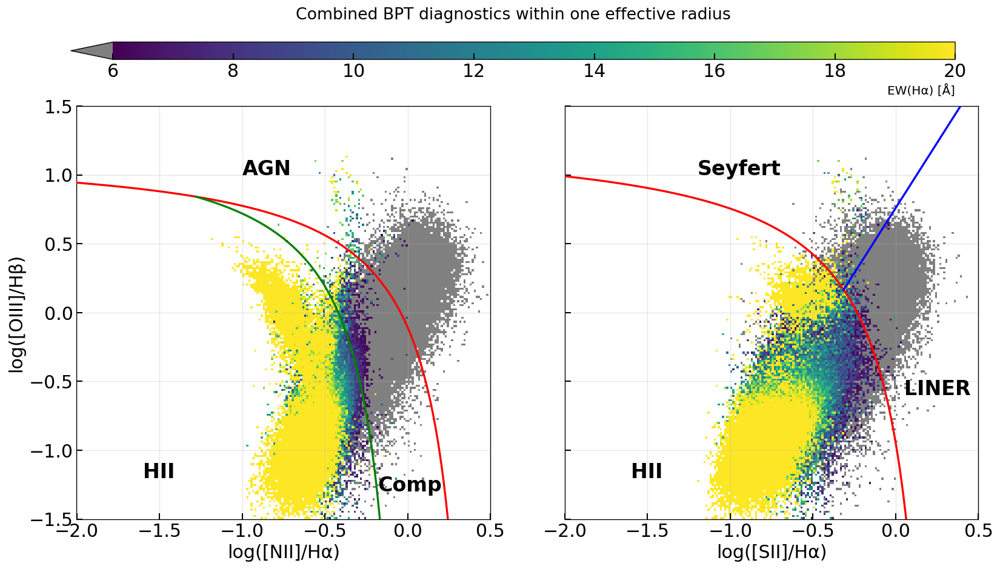


Successfully created combined NII/SII diagrams within one R_e (flux+SFR+EW mask, color by EW(Hα))
Galaxies included: IC3392, NGC4064, NGC4189, NGC4192, NGC4222, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4321, NGC4330, NGC4351, NGC4380, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4424, NGC4450, NGC4457, NGC4501, NGC4522, NGC4535, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4654, NGC4694, NGC4698


In [8]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # Combined Analysis: NII and SII diagrams - color by EW(Halpha)
    # Collect all spaxels within one projected R_e (no HII-only selection)
    # Use only dust-corrected emission line fluxes; no O/H needed
    # Apply SFR mask: keep spaxels with finite LOGSFR_SURFACE_DENSITY_HII,
    #                  LOGSFR_SURFACE_DENSITY_NONHII, or LOGSFR_SURFACE_DENSITY_UNCLASSIFIED2
    # ------------------------------------------------------------------
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import LogNorm
    from pathlib import Path
    from astropy.io import fits


    # BPT reference line functions (for drawing curves only, if desired)
    def kewley01_N2(x):   # max-starburst
        return 0.61/(x-0.47) + 1.19


    def kauff03_N2(x):    # empirical SF upper envelope
        return 0.61/(x-0.05) + 1.30


    def kewley01_S2(x):
        return 0.72/(x-0.32) + 1.30


    def kewley06_Sy_LIN(x):   # Seyfert/LINER division
        return 1.89*x + 0.76


    # Error propagation for BPT ratios (log10 numerator/denominator)
    def bpt_error_propagation(numerator, denominator, numerator_err, denominator_err):
        with np.errstate(divide='ignore', invalid='ignore'):
            log_ratio_err = 1/(np.log(10)) * np.sqrt((numerator_err / numerator)**2 + (denominator_err / denominator)**2)
            return log_ratio_err


    # Create x arrays for the theoretical lines (optional overlay)
    x_kewley_N2 = np.linspace(-2.0, 0.3, 200)
    x_kauff_N2 = np.linspace((286-np.sqrt(2871561))/1100, 0.0, 200)
    x_kewley_S2 = np.linspace(-2.0, 0.3, 200)
    x_kewley06_S2 = np.linspace((159-np.sqrt(105081))/525, 0.5, 200)


    # Get all galaxies from binning files
    galaxies = physics_ready_galaxies(require_ew=True)

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    SIGMA_CONTOUR_MAX = 45.0


    # Collect all spaxels from all galaxies (no HII selection)
    all_logN2 = []
    all_logO3 = []
    all_logS2 = []
    all_ew = []

    # Stats for SFR components
    count_hii = 0
    count_nonhii = 0
    count_unclass = 0
    count_union = 0
    sum_check_total = 0
    sum_check_ok = 0
    sum_check_maxabs = []

    # Stats for SF/NONSF/UNCLASSIFIED1 components
    count_sf = 0
    count_nonsf = 0
    count_unclass1 = 0
    count_union_sf = 0

    selection_rows = []
    total_base_c1 = 0
    total_hii_only = 0
    total_hii_ew6 = 0
    total_hii_ew6_sigma = 0

    # Error arrays for spaxel subsets
    err_hii_logN2, err_hii_logS2, err_hii_logO3 = [], [], []
    err_nonhii_logN2, err_nonhii_logS2, err_nonhii_logO3 = [], [], []
    err_unclass_logN2, err_unclass_logS2, err_unclass_logO3 = [], [], []
    err_hii_nonhii_logN2, err_hii_nonhii_logS2, err_hii_nonhii_logO3 = [], [], []
    err_allclasses_logN2, err_allclasses_logS2, err_allclasses_logO3 = [], [], []

    print('Collecting spaxels within one R_e (corrected fluxes + EW + SFR mask)...')
    for gal in galaxies:
        gas_file = further_gas_path(gal)
        bin_file = further_spatial_path(gal)
        ew_file = further_ew_path(gal, EW_FILE_SUFFIX)

        if gas_file.exists() and bin_file.exists() and ew_file.exists():
            with fits.open(gas_file) as h:
                # Load corrected emission line fluxes
                HB4861_FLUX_corr = h['HB4861_FLUX_CORR'].data
                HA6562_FLUX_corr = h['HA6562_FLUX_CORR'].data
                bpt_wcs_header = h['HA6562_FLUX_CORR'].header.copy()
                OIII5006_FLUX_corr = h['OIII5006_FLUX_CORR'].data
                NII6583_FLUX_corr = h['NII6583_FLUX_CORR'].data
                SII6716_FLUX_corr = h['SII6716_FLUX_CORR'].data
                SII6730_FLUX_corr = h['SII6730_FLUX_CORR'].data

                # Load corrected emission line flux errors
                HB4861_FLUX_ERR = h['HB4861_FLUX_ERR'].data
                HA6562_FLUX_ERR = h['HA6562_FLUX_ERR'].data
                OIII5006_FLUX_ERR = h['OIII5006_FLUX_ERR'].data
                NII6583_FLUX_ERR = h['NII6583_FLUX_ERR'].data
                SII6716_FLUX_ERR = h['SII6716_FLUX_ERR'].data
                SII6730_FLUX_ERR = h['SII6730_FLUX_ERR'].data

                # Load SFR surface density maps
                logSigmaSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
                logSigmaSFR_NONHII = h['LOGSFR_SURFACE_DENSITY_NONHII'].data
                logSigmaSFR_UNCLASS = h['LOGSFR_SURFACE_DENSITY_UNCLASSIFIED2'].data
                logSigmaSFR_TOTAL = h['LOGSFR_SURFACE_DENSITY'].data

                # Load SF / NONSF / UNCLASSIFIED1 maps
                logSigmaSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
                logSigmaSFR_NONSF = h['LOGSFR_SURFACE_DENSITY_NONSF'].data
                logSigmaSFR_UNCLASS1 = h['LOGSFR_SURFACE_DENSITY_UNCLASSIFIED1'].data
                HA6562_SIGMA_OBS = h['HA6562_SIGMA'].data
                HA6562_SIGMA_CORR = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
                if HA6562_SIGMA_CORR is None:
                    raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_file.name}')
                if HA6562_SIGMA_CORR.shape != HA6562_SIGMA_OBS.shape:
                    raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {HA6562_SIGMA_CORR.shape} vs SIGMA {HA6562_SIGMA_OBS.shape}')
                sigma2_intrinsic = HA6562_SIGMA_OBS**2 - HA6562_SIGMA_CORR**2
                HA6562_SIGMA = np.full_like(HA6562_SIGMA_OBS, np.nan, dtype=float)
                sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
                HA6562_SIGMA[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])

            with fits.open(ew_file) as h_ew:
                if EW_HDU not in h_ew:
                    print(f'  {gal}: missing EW HDU {EW_HDU} in {ew_file.name}')
                    continue
                ew_ha = h_ew[EW_HDU].data

            ew_ha = align_map_to_shape(ew_ha, HA6562_FLUX_corr.shape, label=f"{gal} {EW_HDU}")
            re_mask = effective_radius_mask_for_product(
                gal, HA6562_FLUX_corr.shape, bpt_wcs_header
            )

            # SFR masks, restricted to the projected one-R_e aperture.
            hii_mask = re_mask & np.isfinite(logSigmaSFR_HII)
            nonhii_mask = re_mask & np.isfinite(logSigmaSFR_NONHII)
            unclass_mask = re_mask & np.isfinite(logSigmaSFR_UNCLASS)
            total_mask = re_mask & np.isfinite(logSigmaSFR_TOTAL)
            union_mask = hii_mask | nonhii_mask | unclass_mask

            count_hii += np.sum(hii_mask)
            count_nonhii += np.sum(nonhii_mask)
            count_unclass += np.sum(unclass_mask)
            count_union += np.sum(union_mask)

            # SF / NONSF / UNCLASSIFIED1 masks
            sf_mask = re_mask & np.isfinite(logSigmaSFR_SF)
            nonsf_mask = re_mask & np.isfinite(logSigmaSFR_NONSF)
            unclass1_mask = re_mask & np.isfinite(logSigmaSFR_UNCLASS1)
            union_sf_mask = sf_mask | nonsf_mask | unclass1_mask

            count_sf += np.sum(sf_mask)
            count_nonsf += np.sum(nonsf_mask)
            count_unclass1 += np.sum(unclass1_mask)
            count_union_sf += np.sum(union_sf_mask)

            # Check add-up consistency where all components and total are finite
            sum_mask = hii_mask & nonhii_mask & unclass_mask & total_mask
            if np.any(sum_mask):
                diff = logSigmaSFR_TOTAL[sum_mask] - (
                    logSigmaSFR_HII[sum_mask] + logSigmaSFR_NONHII[sum_mask] + logSigmaSFR_UNCLASS[sum_mask]
                )
                sum_check_total += diff.size
                sum_check_ok += np.sum(np.isclose(diff, 0.0, atol=1e-6, rtol=0))
                sum_check_maxabs.append(np.nanmax(np.abs(diff)))

            # Valid where all corrected line fluxes are finite and positive
            flux_mask = re_mask & (
                np.isfinite(HB4861_FLUX_corr) & (HB4861_FLUX_corr > 0) &
                np.isfinite(HA6562_FLUX_corr) & (HA6562_FLUX_corr > 0) &
                np.isfinite(OIII5006_FLUX_corr) & (OIII5006_FLUX_corr > 0) &
                np.isfinite(NII6583_FLUX_corr) & (NII6583_FLUX_corr > 0) &
                np.isfinite(SII6716_FLUX_corr) & (SII6716_FLUX_corr > 0) &
                np.isfinite(SII6730_FLUX_corr) & (SII6730_FLUX_corr > 0)
            )

            # SFR mask: keep spaxels where any class is finite
            sfr_mask = union_mask

            # EW mask
            ew_mask = re_mask & np.isfinite(ew_ha) & (ew_ha > 0)
            ew_mask = ew_mask & np.isfinite(HA6562_SIGMA) & (HA6562_SIGMA < 45.0)

            base_c1_mask = flux_mask & union_mask & np.isfinite(ew_ha) & (ew_ha > 0) & np.isfinite(HA6562_SIGMA_CORR) & (HA6562_SIGMA_CORR > 0)
            hii_only_mask = base_c1_mask & np.isfinite(logSigmaSFR_HII)
            hii_ew6_mask = hii_only_mask & np.isfinite(ew_ha) & (ew_ha > 6.0)
            hii_ew6_sigma_mask = hii_ew6_mask & np.isfinite(HA6562_SIGMA) & (HA6562_SIGMA < 45.0)

            n_base_c1 = int(np.sum(base_c1_mask))
            n_hii_only = int(np.sum(hii_only_mask))
            n_hii_ew6 = int(np.sum(hii_ew6_mask))
            n_hii_ew6_sigma = int(np.sum(hii_ew6_sigma_mask))
            selection_rows.append((gal, n_base_c1, n_hii_only, n_hii_ew6, n_hii_ew6_sigma))
            total_base_c1 += n_base_c1
            total_hii_only += n_hii_only
            total_hii_ew6 += n_hii_ew6
            total_hii_ew6_sigma += n_hii_ew6_sigma

            # Combined mask for plotting
            valid_mask = flux_mask & sfr_mask & ew_mask
            n_pixels = np.sum(valid_mask)
            print(f'  {gal}: {n_pixels} valid spaxels within one R_e (flux+SFR+EW mask)')

            HB_common = HB4861_FLUX_corr[valid_mask]
            HA_common = HA6562_FLUX_corr[valid_mask]
            OIII_common = OIII5006_FLUX_corr[valid_mask]
            NII_common = NII6583_FLUX_corr[valid_mask]
            SII6716_common = SII6716_FLUX_corr[valid_mask]
            SII6730_common = SII6730_FLUX_corr[valid_mask]
            EW_common = ew_ha[valid_mask]

            # Calculate line ratios for all valid spaxels
            logN2 = np.log10(NII_common / HA_common)
            logO3 = np.log10(OIII_common / HB_common)
            logS2 = np.log10((SII6716_common + SII6730_common) / HA_common)

            all_logN2.extend(logN2.flatten())
            all_logO3.extend(logO3.flatten())
            all_logS2.extend(logS2.flatten())
            all_ew.extend(EW_common.flatten())

            # Error propagation for spaxel subsets
            err_mask = re_mask & (
                np.isfinite(HB4861_FLUX_ERR) & (HB4861_FLUX_ERR > 0) &
                np.isfinite(HA6562_FLUX_ERR) & (HA6562_FLUX_ERR > 0) &
                np.isfinite(OIII5006_FLUX_ERR) & (OIII5006_FLUX_ERR > 0) &
                np.isfinite(NII6583_FLUX_ERR) & (NII6583_FLUX_ERR > 0) &
                np.isfinite(SII6716_FLUX_ERR) & (SII6716_FLUX_ERR > 0) &
                np.isfinite(SII6730_FLUX_ERR) & (SII6730_FLUX_ERR > 0)
            )

            def collect_errs(sub_mask, out_N2, out_S2, out_O3):
                valid_err_mask = flux_mask & err_mask & ew_mask & sub_mask
                if np.any(valid_err_mask):
                    hb = HB4861_FLUX_corr[valid_err_mask]
                    ha = HA6562_FLUX_corr[valid_err_mask]
                    o3 = OIII5006_FLUX_corr[valid_err_mask]
                    n2 = NII6583_FLUX_corr[valid_err_mask]
                    s2_1 = SII6716_FLUX_corr[valid_err_mask]
                    s2_2 = SII6730_FLUX_corr[valid_err_mask]

                    hb_err = HB4861_FLUX_ERR[valid_err_mask]
                    ha_err = HA6562_FLUX_ERR[valid_err_mask]
                    o3_err = OIII5006_FLUX_ERR[valid_err_mask]
                    n2_err = NII6583_FLUX_ERR[valid_err_mask]
                    s2_1_err = SII6716_FLUX_ERR[valid_err_mask]
                    s2_2_err = SII6730_FLUX_ERR[valid_err_mask]

                    s2 = s2_1 + s2_2
                    s2_err = np.sqrt(s2_1_err**2 + s2_2_err**2)

                    err_logN2 = bpt_error_propagation(n2, ha, n2_err, ha_err)
                    err_logS2 = bpt_error_propagation(s2, ha, s2_err, ha_err)
                    err_logO3 = bpt_error_propagation(o3, hb, o3_err, hb_err)

                    out_N2.extend(err_logN2[np.isfinite(err_logN2)])
                    out_S2.extend(err_logS2[np.isfinite(err_logS2)])
                    out_O3.extend(err_logO3[np.isfinite(err_logO3)])

            collect_errs(hii_mask, err_hii_logN2, err_hii_logS2, err_hii_logO3)
            collect_errs(nonhii_mask, err_nonhii_logN2, err_nonhii_logS2, err_nonhii_logO3)
            collect_errs(unclass_mask, err_unclass_logN2, err_unclass_logS2, err_unclass_logO3)
            collect_errs(hii_mask | nonhii_mask, err_hii_nonhii_logN2, err_hii_nonhii_logS2, err_hii_nonhii_logO3)
            collect_errs(union_mask, err_allclasses_logN2, err_allclasses_logS2, err_allclasses_logO3)
        else:
            missing_parts = []
            if not gas_file.exists():
                missing_parts.append(gas_file.name)
            if not bin_file.exists():
                missing_parts.append(bin_file.name)
            if not ew_file.exists():
                missing_parts.append(ew_file.name)
            print(f"  {gal}: Missing files -> {', '.join(missing_parts)}")

    # Convert to numpy arrays
    all_logN2 = np.array(all_logN2)
    all_logO3 = np.array(all_logO3)
    all_logS2 = np.array(all_logS2)
    all_ew = np.array(all_ew)

    if len(all_logN2) == 0:
        raise RuntimeError('No valid spaxels found after applying flux+SFR+EW masks.')
    if len(all_ew) != len(all_logN2):
        raise RuntimeError('EW array length mismatch with BPT arrays.')

    # Report SFR component stats
    print(f'\nTotal combined valid spaxels within one R_e (flux+SFR+EW mask): {len(all_logN2)}')
    if count_union > 0:
        print('\nSFR component counts (finite spaxels, all galaxies combined):')
        print(f'  HII: {count_hii} ({count_hii / count_union * 100:.3f}%)')
        print(f'  NONHII: {count_nonhii} ({count_nonhii / count_union * 100:.3f}%)')
        print(f'  UNCLASSIFIED2: {count_unclass} ({count_unclass / count_union * 100:.3f}%)')

    if count_union > 0:
        print('\nSF component counts (finite spaxels, all galaxies combined):')
        print(f'  SF: {count_sf} ({count_sf / count_union * 100:.3f}%)')
        print(f'  NONSF: {count_nonsf} ({count_nonsf / count_union * 100:.3f}%)')
        print(f'  UNCLASSIFIED1: {count_unclass1} ({count_unclass1 / count_union * 100:.3f}%)')

    if sum_check_total > 0:
        max_abs_diff = np.nanmax(sum_check_maxabs) if len(sum_check_maxabs) > 0 else np.nan
        print('\nCheck LOGSFR_SURFACE_DENSITY ≈ HII + NONHII + UNCLASSIFIED2 (finite spaxels):')
        print(f'  Passed: {sum_check_ok} / {sum_check_total} ({sum_check_ok / sum_check_total:.3f})')
        print(f'  Max |Δ|: {max_abs_diff:.3e}')

    def frac(numerator, denominator):
        return np.nan if denominator == 0 else numerator / denominator

    print('\nSelection chain (per galaxy):')
    print('  Base(Cell1) -> HII -> HII+EW>6 -> HII+EW>6+sigma_int<45')
    header_sel = (
        f"{'Galaxy':<10} {'Base(C1)':>10} {'HII':>10} {'f(HII)':>10} "
        f"{'HII+EW>6':>12} {'f(HII+EW)':>12} {'HII+EW+sig<45':>16} {'f(final)':>10}"
    )
    print(header_sel)
    print('-' * len(header_sel))
    for gal_sel, n_base_sel, n_hii_sel, n_hii_ew_sel, n_hii_ew_sig_sel in selection_rows:
        print(
            f"{gal_sel:<10} {n_base_sel:10d} {n_hii_sel:10d} {frac(n_hii_sel, n_base_sel):10.4f} "
            f"{n_hii_ew_sel:12d} {frac(n_hii_ew_sel, n_base_sel):12.4f} {n_hii_ew_sig_sel:16d} {frac(n_hii_ew_sig_sel, n_base_sel):10.4f}"
        )
    print('-' * len(header_sel))
    print(
        f"{'ALL':<10} {total_base_c1:10d} {total_hii_only:10d} {frac(total_hii_only, total_base_c1):10.4f} "
        f"{total_hii_ew6:12d} {frac(total_hii_ew6, total_base_c1):12.4f} {total_hii_ew6_sigma:16d} {frac(total_hii_ew6_sigma, total_base_c1):10.4f}"
    )

    # Mean log-errors for requested subsets

    def mean_or_nan(arr):
        return np.nanmean(arr) if len(arr) > 0 else np.nan

    print('\nMean log-error (spaxel subsets):')
    print(f'  HII only       - log([NII]/Hα): {mean_or_nan(err_hii_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_hii_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_hii_logO3):.4f}')
    print(f'  NONHII only    - log([NII]/Hα): {mean_or_nan(err_nonhii_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_nonhii_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_nonhii_logO3):.4f}')
    print(f'  UNCLASS only   - log([NII]/Hα): {mean_or_nan(err_unclass_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_unclass_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_unclass_logO3):.4f}')
    print(f'  HII+NONHII     - log([NII]/Hα): {mean_or_nan(err_hii_nonhii_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_hii_nonhii_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_hii_nonhii_logO3):.4f}')
    print(f'  HII+NONHII+UNC - log([NII]/Hα): {mean_or_nan(err_allclasses_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_allclasses_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_allclasses_logO3):.4f}')

    # Create diagrams for all spaxels (2D EW color)
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    plt.subplots_adjust(wspace=0.18, top=0.82)

    import copy

    cmap_ew = copy.copy(plt.get_cmap('viridis'))
    cmap_ew.set_under('grey')

    # Binning and ranges
    xlim = (-2.0, 0.5)
    ylim = (-1.5, 1.5)
    bins_2d = 200
    min_count_per_bin = 3
    vmin_ew = 6.0
    vmax_ew = 20.0

    # NII panel EW grid
    hist_N2, xedges_N2, yedges_N2 = np.histogram2d(
        all_logN2, all_logO3, bins=bins_2d, range=[xlim, ylim]
    )
    sum_ew_N2, _, _ = np.histogram2d(
        all_logN2, all_logO3, bins=bins_2d, range=[xlim, ylim], weights=all_ew
    )
    mean_ew_N2 = np.divide(
        sum_ew_N2,
        hist_N2,
        out=np.full_like(sum_ew_N2, np.nan, dtype=float),
        where=hist_N2 > 0,
    )
    mean_ew_N2[hist_N2 < min_count_per_bin] = np.nan

    # SII panel EW grid
    hist_S2, xedges_S2, yedges_S2 = np.histogram2d(
        all_logS2, all_logO3, bins=bins_2d, range=[xlim, ylim]
    )
    sum_ew_S2, _, _ = np.histogram2d(
        all_logS2, all_logO3, bins=bins_2d, range=[xlim, ylim], weights=all_ew
    )
    mean_ew_S2 = np.divide(
        sum_ew_S2,
        hist_S2,
        out=np.full_like(sum_ew_S2, np.nan, dtype=float),
        where=hist_S2 > 0,
    )
    mean_ew_S2[hist_S2 < min_count_per_bin] = np.nan

    # NII diagram
    ax = axes[0]
    img_N2 = ax.pcolormesh(
        xedges_N2,
        yedges_N2,
        np.ma.masked_invalid(mean_ew_N2.T),
        cmap=cmap_ew,
        vmin=vmin_ew,
        vmax=vmax_ew,
        shading='auto',
        edgecolors='face',
        linewidths=0
    )

    # Optional: overlay BPT curves as reference only
    ax.plot(x_kewley_N2, kewley01_N2(x_kewley_N2), 'r-', lw=2, label='Kewley+01', zorder=10)
    ax.plot(x_kauff_N2, kauff03_N2(x_kauff_N2), 'g-', lw=2, label='Kauffmann+03', zorder=10)

    ax.set_xlabel('log([NII]/Hα)', fontsize=18)
    ax.set_ylabel('log([OIII]/Hβ)', fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')
    ax.text(-0.18, -1.3, 'Comp', fontsize=20, fontweight='bold')
    ax.text(-1.0, 1.0, 'AGN', fontsize=20, fontweight='bold')
    ax.grid(True, alpha=0.3)

    # SII diagram
    ax = axes[1]
    img_S2 = ax.pcolormesh(
        xedges_S2,
        yedges_S2,
        np.ma.masked_invalid(mean_ew_S2.T),
        cmap=cmap_ew,
        vmin=vmin_ew,
        vmax=vmax_ew,
        shading='auto',
        edgecolors='face',
        linewidths=0
    )

    ax.plot(x_kewley_S2, kewley01_S2(x_kewley_S2), 'r-', lw=2, label='Kewley+01', zorder=10)
    ax.plot(x_kewley06_S2, kewley06_Sy_LIN(x_kewley06_S2), 'b-', lw=2, label='Kewley+06', zorder=10)

    ax.set_xlabel('log([SII]/Hα)', fontsize=18)
    ax.set_ylabel('')
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.tick_params(axis='y', labelleft=False)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')
    ax.text(-1.2, 1.0, 'Seyfert', fontsize=20, fontweight='bold')
    ax.text(0.05, -0.6, 'LINER', fontsize=20, fontweight='bold')
    ax.grid(True, alpha=0.3)

    fig.suptitle('Combined BPT diagnostics within one effective radius', y=0.99, fontsize=16)

    # Shared colorbar (top, spanning both panels)
    cax = fig.add_axes([0.12, 0.9, 0.76, 0.03])
    cbar = fig.colorbar(img_N2, cax=cax, orientation='horizontal', extend='min')
    cbar.set_label('EW(Hα) [Å]', fontsize=12, loc='right')
    cbar.ax.tick_params(labelsize=18)

    # Save figures
    output_dir = Path('Plot_Paper_1')
    output_dir.mkdir(parents=True, exist_ok=True)
    # fig.savefig(output_dir / 'Combined_BPT_diagrams_by_EW_HII_NONHII.png', dpi=600, bbox_inches='tight')
    # fig.savefig(output_dir / 'Combined_BPT_diagrams_by_EW_HII_NONHII.pdf', bbox_inches='tight')
    plt.show()

    print('\nSuccessfully created combined NII/SII diagrams within one R_e (flux+SFR+EW mask, color by EW(Hα))')
    print('Galaxies included: ' + ', '.join(galaxies))
else:
    print("Skipped copied previous-project analysis cell 3: no nested *_further mass/SFR/OH+EW products are ready yet.")


### Combined rSFMS and O3N2–M13 rMZR by infall stage

Side-by-side comparison using the same stage colours, 0.4-dex stellar-mass
bins, median trends, and 16th–84th percentile bands as the individual panels
above. The left panel shows rSFMS and the right panel shows O3N2–M13 rMZR.
All plotted spaxels also satisfy the projected one-effective-radius aperture defined above.


  IC3392: 13897 HII spaxels within one R_e, stage 3 (Post-peak)
  NGC4064: 6652 HII spaxels within one R_e, stage 3 (Post-peak)
  NGC4189: 42849 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4192: 40856 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4222: 11948 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4254: 110145 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4293: 505 HII spaxels within one R_e, stage 3 (Post-peak)
  NGC4294: 21535 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4298: 74097 HII spaxels within one R_e, stage 2 (Close-to-peak)
  NGC4302: 12748 HII spaxels within one R_e, stage 2 (Close-to-peak)
  NGC4321: 353600 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4330: 30044 HII spaxels within one R_e, stage 2 (Close-to-peak)
  NGC4351: 25192 HII spaxels within one R_e, stage 1 (Pre-peak)
  NGC4380: 34497 HII spaxels within one R_e, stage 3 (Post-peak)
  NGC4383: excluded from analysis
  NGC4388: 13672 HII spaxels within one R_e, stage 2 

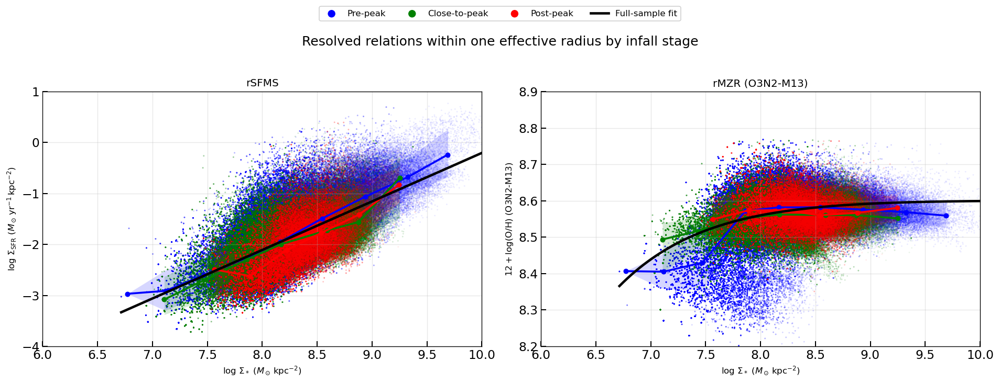

In [9]:
# Standalone side-by-side rSFMS and O3N2-M13 rMZR comparison within one R_e.
COMBINED_XRANGE = (6.0, 10.0)
COMBINED_RSFMS_YRANGE = (-4.0, 1.0)
COMBINED_RMZR_YRANGE = (8.2, 8.9)
COMBINED_BIN_WIDTH = 0.4
COMBINED_MIN_PIXELS_PER_BIN = 20
COMBINED_EW_MIN = 6.0
COMBINED_EW_HDU = "PROXY_EWHA"
COMBINED_EW_SUFFIX = "_proxy_EW_maps.fits"
COMBINED_EXCLUDED_GALAXIES = {"NGC4383"}
COMBINED_INFALL_COLORS = {1: "blue", 2: "green", 3: "red"}
COMBINED_INFALL_LABELS = {
    1: "Pre-peak", 2: "Close-to-peak", 3: "Post-peak"
}

with fits.open(PROJECT_ROOT / "mauve_master_wiki_newclass.fits") as hdul:
    combined_infall_class = {
        row["Galaxy"].strip(): int(row["class"])
        for row in hdul[1].data
    }
combined_infall_class = add_combined_infall_classes(combined_infall_class)


def combined_binned_percentiles(x, y, bin_edges, min_pixels=20):
    """Return median x/y and the 16th-84th percentile y range per bin."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    finite = np.isfinite(x) & np.isfinite(y)
    x = x[finite]
    y = y[finite]
    x_median, y_median, y16, y84, counts = [], [], [], [], []
    for left, right in zip(bin_edges[:-1], bin_edges[1:]):
        in_bin = (x >= left) & (x < right)
        if in_bin.sum() < min_pixels:
            continue
        x_median.append(np.nanmedian(x[in_bin]))
        y_median.append(np.nanmedian(y[in_bin]))
        y16.append(np.nanpercentile(y[in_bin], 16))
        y84.append(np.nanpercentile(y[in_bin], 84))
        counts.append(int(in_bin.sum()))
    return tuple(
        np.asarray(values)
        for values in (x_median, y_median, y16, y84, counts)
    )


def collect_combined_relation(y_hdu, readiness_column, relation_label):
    """Load one relation by infall stage within one projected R_e."""
    ready = (
        PRODUCTS["has_mass_map"]
        & PRODUCTS[readiness_column]
        & PRODUCTS["has_proxy_ew"]
    )
    galaxies = PRODUCTS.index[ready].tolist()
    x_by_stage = {stage: [] for stage in [1, 2, 3]}
    y_by_stage = {stage: [] for stage in [1, 2, 3]}

    print(f"Collecting HII spaxels within one R_e for {relation_label}...")
    for galaxy in galaxies:
        if galaxy in COMBINED_EXCLUDED_GALAXIES:
            print(f"  {galaxy}: excluded from analysis")
            continue

        stage = combined_infall_class.get(galaxy)
        if stage not in COMBINED_INFALL_COLORS:
            print(f"  {galaxy}: skipped - no infall class in master table")
            continue

        try:
            spatial_path = further_spatial_path(galaxy)
            gas_path = further_gas_path(galaxy)
            ew_path = further_ew_path(galaxy, COMBINED_EW_SUFFIX)
            with fits.open(spatial_path) as hdul:
                log_sigma_m = require_hdu_data(
                    hdul, "LOGMASS_SURFACE_DENSITY", spatial_path
                )
            with fits.open(gas_path) as hdul:
                y_map = require_hdu_data(hdul, y_hdu, gas_path)
                relation_wcs_header = hdul[y_hdu].header.copy()
            with fits.open(ew_path) as hdul:
                ew_ha = require_hdu_data(hdul, COMBINED_EW_HDU, ew_path)

            log_sigma_m = align_map_to_shape(
                log_sigma_m, y_map.shape, label=f"{galaxy} stellar mass"
            )
            ew_ha = align_map_to_shape(
                ew_ha, y_map.shape, label=f"{galaxy} {COMBINED_EW_HDU}"
            )
        except Exception as exc:
            print(f"  {galaxy}: skipped - {exc}")
            continue

        re_mask = effective_radius_mask_for_product(
            galaxy, y_map.shape, relation_wcs_header
        )
        mask = (
            re_mask
            & np.isfinite(log_sigma_m)
            & np.isfinite(y_map)
            & np.isfinite(ew_ha)
            & (ew_ha > COMBINED_EW_MIN)
        )
        n_spaxels = int(mask.sum())
        print(
            f"  {galaxy}: {n_spaxels} HII spaxels within one R_e, "
            f"stage {stage} ({COMBINED_INFALL_LABELS[stage]})"
        )
        if n_spaxels == 0:
            continue

        x_by_stage[stage].extend(log_sigma_m[mask].ravel())
        y_by_stage[stage].extend(y_map[mask].ravel())

    for stage in [1, 2, 3]:
        x_by_stage[stage] = np.asarray(x_by_stage[stage])
        y_by_stage[stage] = np.asarray(y_by_stage[stage])
    if not any(x_by_stage[stage].size for stage in [1, 2, 3]):
        raise RuntimeError(f"No valid HII spaxels found for {relation_label}.")
    return x_by_stage, y_by_stage


combined_logSigmaM_rsfms, combined_logSigmaSFR = collect_combined_relation(
    "LOGSFR_SURFACE_DENSITY_HII", "has_sfr_map", "rSFMS"
)
combined_logSigmaM_rmzr, combined_oh_m13 = collect_combined_relation(
    "O_H_O3N2_M13_HII", "has_o3n2_m13", "O3N2-M13 rMZR"
)

fig, (ax_sfms, ax_rmzr) = plt.subplots(
    1, 2, figsize=(16, 6), sharex=True
)

combined_mass_bins = np.arange(
    COMBINED_XRANGE[0],
    COMBINED_XRANGE[1] + COMBINED_BIN_WIDTH,
    COMBINED_BIN_WIDTH,
)


def concatenate_stage_relation_data(x_by_stage, y_by_stage):
    """Concatenate the finite full-sample relation across infall stages."""
    x = np.concatenate([x_by_stage[stage] for stage in [1, 2, 3]])
    y = np.concatenate([y_by_stage[stage] for stage in [1, 2, 3]])
    finite = np.isfinite(x) & np.isfinite(y)
    return x[finite], y[finite]


def fit_full_sample_rsfms(x_by_stage, y_by_stage):
    """Return the ordinary-least-squares straight line for all valid spaxels."""
    x, y = concatenate_stage_relation_data(x_by_stage, y_by_stage)
    if x.size < 2:
        raise RuntimeError("At least two finite rSFMS spaxels are required for OLS.")
    design = np.column_stack((x, np.ones_like(x)))
    slope, intercept = np.linalg.lstsq(design, y, rcond=None)[0]
    x_model = np.linspace(np.nanmin(x), np.nanmax(x), 200)
    print(f"Full-sample rSFMS OLS: slope={slope:.4f}, intercept={intercept:.4f}")
    return x_model, slope * x_model + intercept


def combined_rmzr_model(x, a, b, c):
    """Sanchez-style rMZR functional form used in the reference notebook."""
    return a + b * (x - c) * np.exp(-(x - c))


def fit_full_sample_rmzr(x_by_stage, y_by_stage):
    """Return the fitted Sanchez-style curve for all valid rMZR spaxels."""
    from scipy.optimize import curve_fit

    x, y = concatenate_stage_relation_data(x_by_stage, y_by_stage)
    if x.size < 10:
        raise RuntimeError("At least ten finite rMZR spaxels are required for fitting.")
    popt, pcov = curve_fit(
        combined_rmzr_model,
        x,
        y,
        p0=[8.5, 0.0002, 12.5],
        bounds=([8.0, 0.0, 10.0], [9.0, 0.1, 15.0]),
        maxfev=5000,
    )
    x_model = np.linspace(np.nanmin(x), np.nanmax(x), 200)
    perr = np.sqrt(np.diag(pcov))
    print(
        "Full-sample rMZR fit: "
        f"a={popt[0]:.3f} +/- {perr[0]:.3f}, "
        f"b={popt[1]:.5f} +/- {perr[1]:.5f}, "
        f"c={popt[2]:.3f} +/- {perr[2]:.3f}"
    )
    return x_model, combined_rmzr_model(x_model, *popt)


combined_rsfms_full_sample_fit = fit_full_sample_rsfms(
    combined_logSigmaM_rsfms, combined_logSigmaSFR
)
combined_rmzr_full_sample_fit = fit_full_sample_rmzr(
    combined_logSigmaM_rmzr, combined_oh_m13
)


def plot_infall_stage_panel(
    ax, x_by_stage, y_by_stage, full_sample_fit, *, ylabel, ylim, title
):
    """Plot stage trends and the black full-sample fitting relation."""
    scatter_handles = []
    for stage in [1, 2, 3]:
        x = x_by_stage[stage]
        y = y_by_stage[stage]
        if x.size == 0:
            continue

        color = COMBINED_INFALL_COLORS[stage]
        label = COMBINED_INFALL_LABELS[stage]
        scatter = ax.scatter(
            x, y, s=3, alpha=0.08, color=color, edgecolors="none",
            rasterized=True, label=label,
        )
        scatter_handles.append(scatter)

        x_med, y_med, y16, y84, counts = combined_binned_percentiles(
            x, y, combined_mass_bins,
            min_pixels=COMBINED_MIN_PIXELS_PER_BIN,
        )
        if x_med.size:
            ax.fill_between(
                x_med, y16, y84, color=color, alpha=0.16, linewidth=0
            )
            ax.plot(
                x_med, y_med, color=color, marker="o",
                markersize=5, linewidth=2.2,
            )

    fit_handle, = ax.plot(
        *full_sample_fit, color="black", linewidth=2.8,
        label="Full-sample fit", zorder=20,
    )

    ax.set(
        xlabel=r"$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$",
        ylabel=ylabel,
        xlim=COMBINED_XRANGE,
        ylim=ylim,
        title=title,
    )
    ax.grid(True, alpha=0.3)
    return scatter_handles, fit_handle


legend_handles, full_sample_fit_handle = plot_infall_stage_panel(
    ax_sfms,
    combined_logSigmaM_rsfms,
    combined_logSigmaSFR,
    combined_rsfms_full_sample_fit,
    ylabel=(
        r"$\log\,\Sigma_{\mathrm{SFR}} \ "
        r"(M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$"
    ),
    ylim=COMBINED_RSFMS_YRANGE,
    title="rSFMS",
)

plot_infall_stage_panel(
    ax_rmzr,
    combined_logSigmaM_rmzr,
    combined_oh_m13,
    combined_rmzr_full_sample_fit,
    ylabel=r"$12 + \log(\mathrm{O/H})$ (O3N2-M13)",
    ylim=COMBINED_RMZR_YRANGE,
    title="rMZR (O3N2-M13)",
)

legend = fig.legend(
    handles=legend_handles + [full_sample_fit_handle],
    labels=(
        [COMBINED_INFALL_LABELS[stage] for stage in [1, 2, 3]]
        + ["Full-sample fit"]
    ),
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=4,
    framealpha=0.9,
    markerscale=5,
)
for handle in legend.legend_handles:
    handle.set_alpha(1.0)

fig.suptitle("Resolved relations within one effective radius by infall stage", y=0.93, fontsize=15)
plt.tight_layout(rect=(0, 0, 1, 0.90))
# plt.savefig(OUTDIR / "MAUVE_MUSE_rSFMS_rMZR_O3N2_M13_infall_EW.png", dpi=600, bbox_inches="tight")
# plt.savefig(OUTDIR / "MAUVE_MUSE_rSFMS_rMZR_O3N2_M13_infall_EW.pdf", bbox_inches="tight")
plt.show()


  IC3392: 13897 HII spaxels within one R_e
  NGC4064: 6652 HII spaxels within one R_e
  NGC4189: 42849 HII spaxels within one R_e
  NGC4192: 40856 HII spaxels within one R_e
  NGC4222: 11948 HII spaxels within one R_e
  NGC4254: 110145 HII spaxels within one R_e
  NGC4293: 505 HII spaxels within one R_e
  NGC4294: 21535 HII spaxels within one R_e
  NGC4298: 74097 HII spaxels within one R_e
  NGC4302: 12748 HII spaxels within one R_e
  NGC4321: 353600 HII spaxels within one R_e
  NGC4330: 30044 HII spaxels within one R_e
  NGC4351: 25192 HII spaxels within one R_e
  NGC4380: 34497 HII spaxels within one R_e
  NGC4383: 8537 HII spaxels within one R_e
  NGC4388: 13672 HII spaxels within one R_e
  NGC4394: 18016 HII spaxels within one R_e
  NGC4396: 37968 HII spaxels within one R_e
  NGC4402: 39671 HII spaxels within one R_e
  NGC4405: 13299 HII spaxels within one R_e
  NGC4419: 1661 HII spaxels within one R_e
  NGC4424: 14821 HII spaxels within one R_e
  NGC4450: 4820 HII spaxels within o

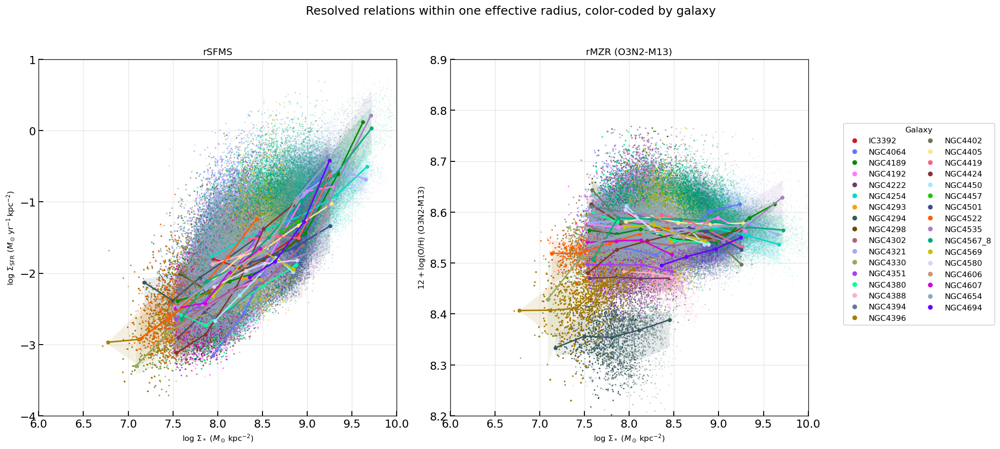

In [10]:
# Standalone side-by-side rSFMS and O3N2-M13 rMZR comparison by galaxy.
COMBINED_XRANGE = (6.0, 10.0)
COMBINED_RSFMS_YRANGE = (-4.0, 1.0)
COMBINED_RMZR_YRANGE = (8.2, 8.9)
COMBINED_BIN_WIDTH = 0.4
COMBINED_MIN_PIXELS_PER_BIN = 20
COMBINED_EW_MIN = 6.0
COMBINED_EW_HDU = "PROXY_EWHA"
COMBINED_EW_SUFFIX = "_proxy_EW_maps.fits"
COMBINED_EXCLUDED_GALAXIES = {"NGC4383"}


def combined_binned_percentiles(x, y, bin_edges, min_pixels=20):
    """Return median x/y and the 16th-84th percentile y range per bin."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    finite = np.isfinite(x) & np.isfinite(y)
    x = x[finite]
    y = y[finite]
    x_median, y_median, y16, y84, counts = [], [], [], [], []
    for left, right in zip(bin_edges[:-1], bin_edges[1:]):
        in_bin = (x >= left) & (x < right)
        if in_bin.sum() < min_pixels:
            continue
        x_median.append(np.nanmedian(x[in_bin]))
        y_median.append(np.nanmedian(y[in_bin]))
        y16.append(np.nanpercentile(y[in_bin], 16))
        y84.append(np.nanpercentile(y[in_bin], 84))
        counts.append(int(in_bin.sum()))
    return tuple(
        np.asarray(values)
        for values in (x_median, y_median, y16, y84, counts)
    )


def collect_combined_relation(y_hdu, readiness_column, relation_label):
    """Load one relation and retain HII spaxels within one R_e by galaxy."""
    ready = (
        PRODUCTS["has_mass_map"]
        & PRODUCTS[readiness_column]
        & PRODUCTS["has_proxy_ew"]
    )
    galaxies = ordered_galaxies_by_fixed_palette(PRODUCTS.index[ready].tolist())
    x_by_galaxy = {}
    y_by_galaxy = {}

    print(f"Collecting HII spaxels within one R_e for {relation_label}...")
    for galaxy in galaxies:
        try:
            spatial_path = further_spatial_path(galaxy)
            gas_path = further_gas_path(galaxy)
            ew_path = further_ew_path(galaxy, COMBINED_EW_SUFFIX)
            with fits.open(spatial_path) as hdul:
                log_sigma_m = require_hdu_data(
                    hdul, "LOGMASS_SURFACE_DENSITY", spatial_path
                )
            with fits.open(gas_path) as hdul:
                y_map = require_hdu_data(hdul, y_hdu, gas_path)
                relation_wcs_header = hdul[y_hdu].header.copy()
            with fits.open(ew_path) as hdul:
                ew_ha = require_hdu_data(hdul, COMBINED_EW_HDU, ew_path)

            log_sigma_m = align_map_to_shape(
                log_sigma_m, y_map.shape, label=f"{galaxy} stellar mass"
            )
            ew_ha = align_map_to_shape(
                ew_ha, y_map.shape, label=f"{galaxy} {COMBINED_EW_HDU}"
            )
        except Exception as exc:
            print(f"  {galaxy}: skipped - {exc}")
            continue

        re_mask = effective_radius_mask_for_product(
            galaxy, y_map.shape, relation_wcs_header
        )
        mask = (
            re_mask
            & np.isfinite(log_sigma_m)
            & np.isfinite(y_map)
            & np.isfinite(ew_ha)
            & (ew_ha > COMBINED_EW_MIN)
        )
        n_spaxels = int(mask.sum())
        print(f"  {galaxy}: {n_spaxels} HII spaxels within one R_e")
        if n_spaxels == 0:
            continue

        x_by_galaxy[galaxy] = np.asarray(log_sigma_m[mask].ravel())
        y_by_galaxy[galaxy] = np.asarray(y_map[mask].ravel())

    if not x_by_galaxy:
        raise RuntimeError(f"No valid HII spaxels found for {relation_label}.")
    return x_by_galaxy, y_by_galaxy


combined_logSigmaM_rsfms, combined_logSigmaSFR = collect_combined_relation(
    "LOGSFR_SURFACE_DENSITY_HII", "has_sfr_map", "rSFMS"
)
combined_logSigmaM_rmzr, combined_oh_m13 = collect_combined_relation(
    "O_H_O3N2_M13_HII", "has_o3n2_m13", "O3N2-M13 rMZR"
)
individual_galaxies = ordered_galaxies_by_fixed_palette(
    set(combined_logSigmaM_rsfms) | set(combined_logSigmaM_rmzr)
)
combined_galaxies = [
    galaxy for galaxy in individual_galaxies
    if galaxy not in COMBINED_EXCLUDED_GALAXIES
]

fig, (ax_sfms, ax_rmzr) = plt.subplots(
    1, 2, figsize=(18, 8), sharex=True
)

combined_mass_bins = np.arange(
    COMBINED_XRANGE[0],
    COMBINED_XRANGE[1] + COMBINED_BIN_WIDTH,
    COMBINED_BIN_WIDTH,
)


def plot_galaxy_panel(
    ax, x_by_galaxy, y_by_galaxy, galaxies, *, ylabel, ylim, title
):
    """Plot faint spaxels plus a binned median trend for each galaxy."""
    for galaxy in galaxies:
        if galaxy not in x_by_galaxy:
            continue

        x = x_by_galaxy[galaxy]
        y = y_by_galaxy[galaxy]
        color = galaxy_color(galaxy)
        ax.scatter(
            x, y, s=3, alpha=0.10, color=color, edgecolors="none",
            rasterized=True,
        )

        x_med, y_med, y16, y84, counts = combined_binned_percentiles(
            x, y, combined_mass_bins,
            min_pixels=COMBINED_MIN_PIXELS_PER_BIN,
        )
        if x_med.size:
            ax.fill_between(
                x_med, y16, y84, color=color, alpha=0.12, linewidth=0
            )
            ax.plot(
                x_med, y_med, color=color, marker="o",
                markersize=4, linewidth=1.8,
            )

    ax.set(
        xlabel=r"$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$",
        ylabel=ylabel,
        xlim=COMBINED_XRANGE,
        ylim=ylim,
        title=title,
    )
    ax.grid(True, alpha=0.3)


plot_galaxy_panel(
    ax_sfms,
    combined_logSigmaM_rsfms,
    combined_logSigmaSFR,
    combined_galaxies,
    ylabel=(
        r"$\log\,\Sigma_{\mathrm{SFR}} \ "
        r"(M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$"
    ),
    ylim=COMBINED_RSFMS_YRANGE,
    title="rSFMS",
)

plot_galaxy_panel(
    ax_rmzr,
    combined_logSigmaM_rmzr,
    combined_oh_m13,
    combined_galaxies,
    ylabel=r"$12 + \log(\mathrm{O/H})$ (O3N2-M13)",
    ylim=COMBINED_RMZR_YRANGE,
    title="rMZR (O3N2-M13)",
)

fig.legend(
    handles=galaxy_legend_handles(combined_galaxies, markersize=6),
    loc="center left",
    bbox_to_anchor=(0.82, 0.5),
    ncol=2,
    framealpha=0.9,
    title="Galaxy",
)
fig.suptitle("Resolved relations within one effective radius, color-coded by galaxy", fontsize=15)
plt.tight_layout(rect=(0, 0, 0.81, 0.95))
# plt.savefig(OUTDIR / "MAUVE_MUSE_rSFMS_rMZR_O3N2_M13_galaxy_EW.png", dpi=600, bbox_inches="tight")
# plt.savefig(OUTDIR / "MAUVE_MUSE_rSFMS_rMZR_O3N2_M13_galaxy_EW.pdf", bbox_inches="tight")
plt.show()


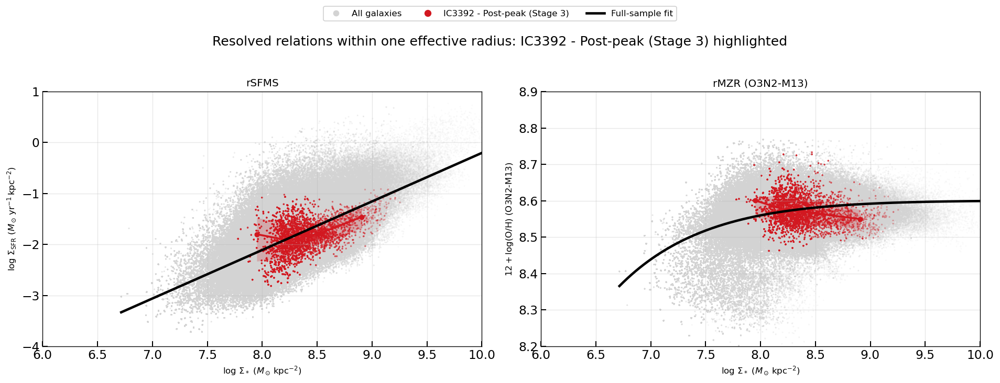

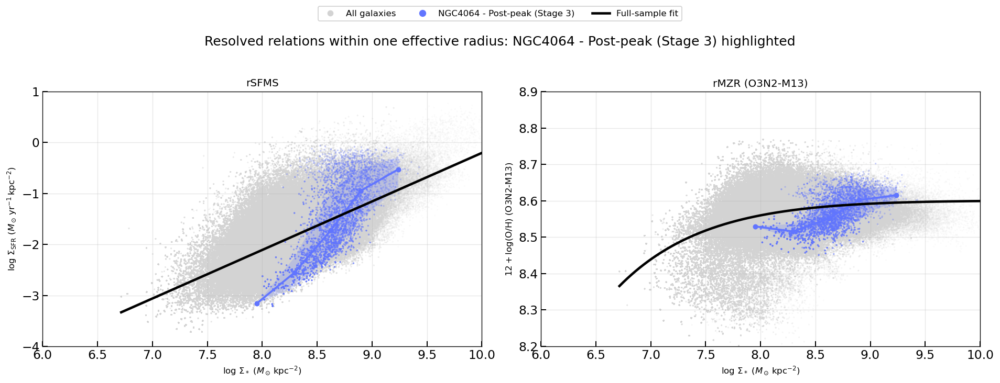

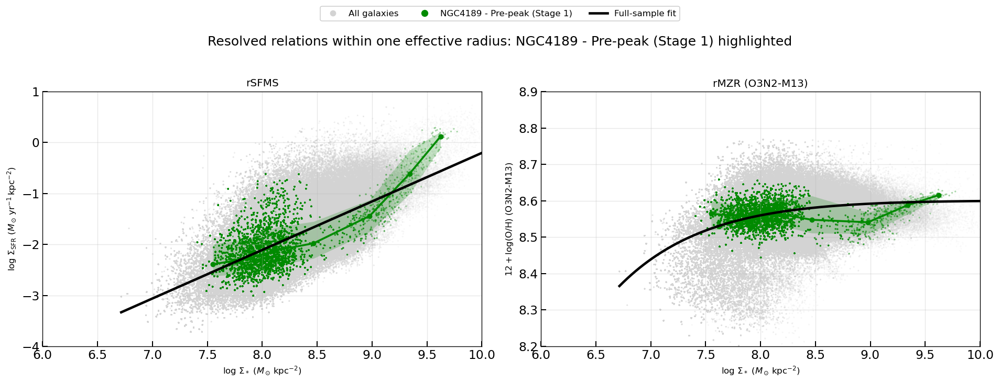

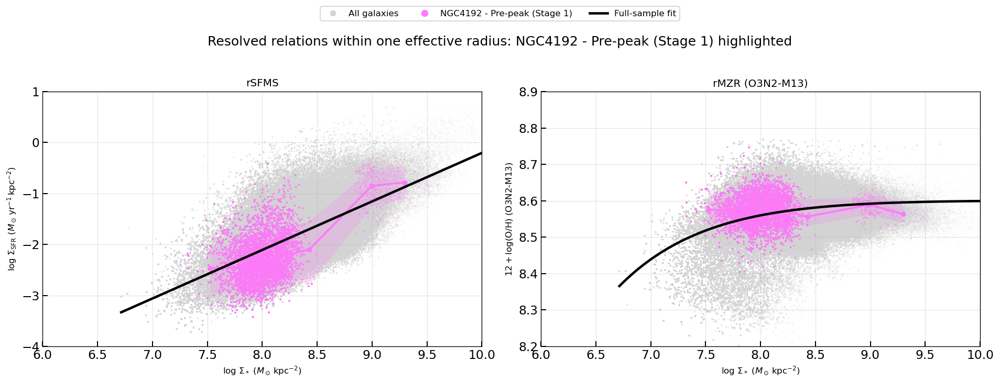

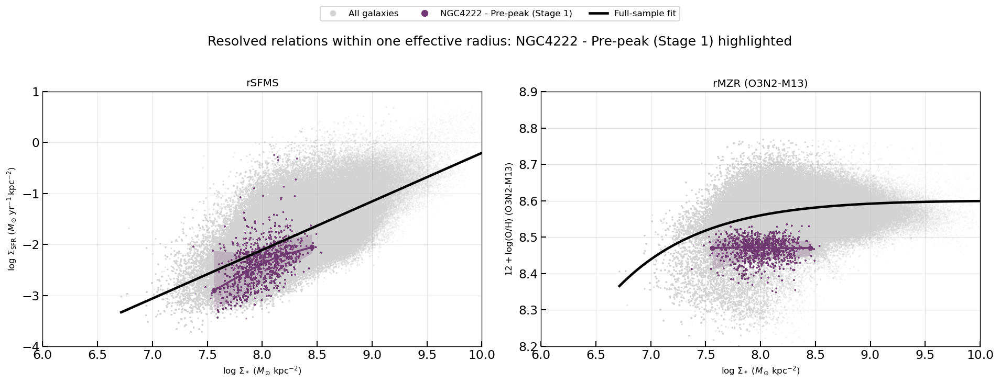

...

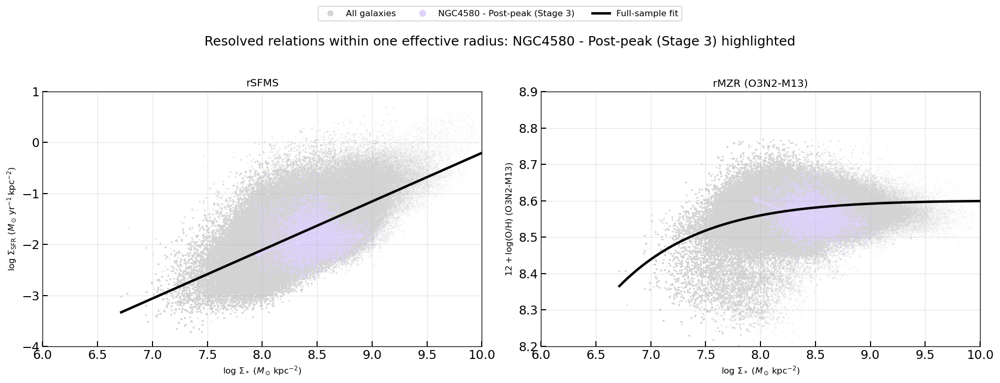

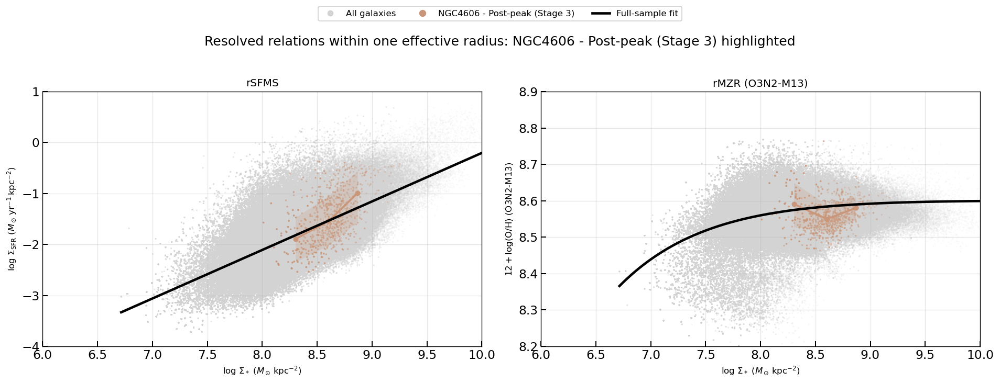

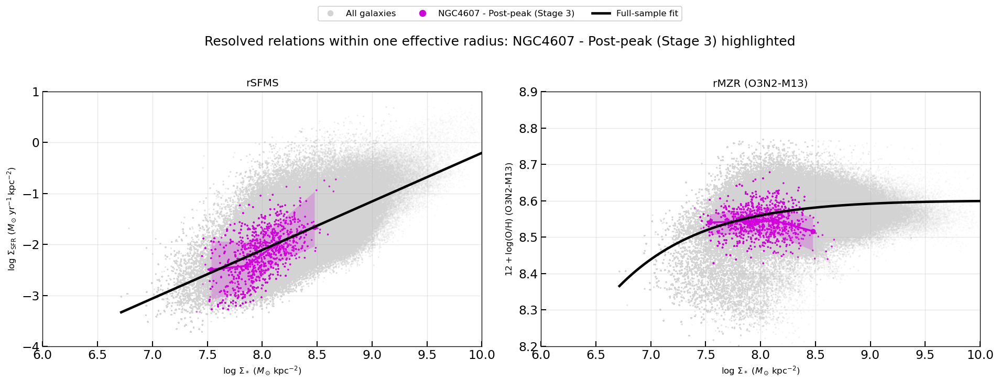

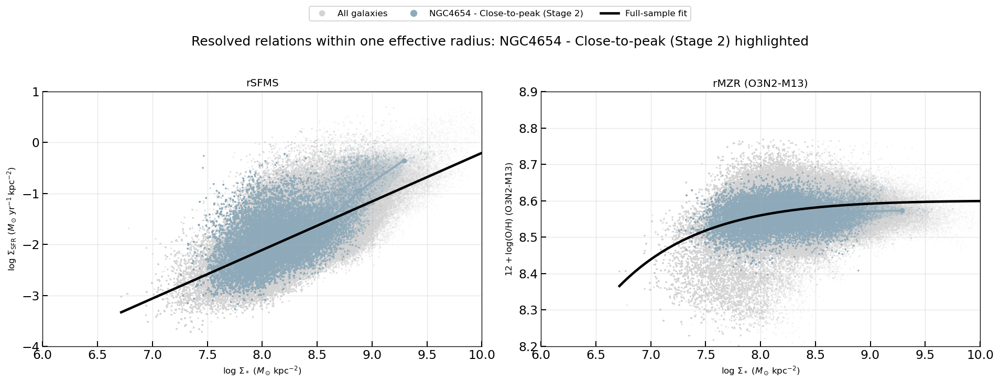

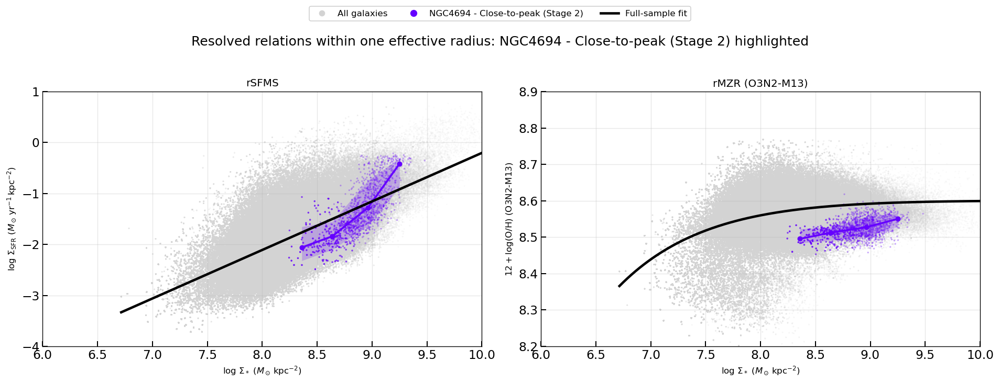

In [11]:
# Generate one side-by-side relation plot per galaxy.
# All available galaxies remain in light gray; only the selected galaxy is colored.
from matplotlib.lines import Line2D

HIGHLIGHT_BACKGROUND_COLOR = "lightgray"
HIGHLIGHT_BACKGROUND_ALPHA = 0.10
HIGHLIGHT_GALAXY_ALPHA = 0.32


def concatenate_relation_data(x_by_galaxy, y_by_galaxy):
    """Concatenate all available per-galaxy arrays for a gray background."""
    galaxies = [
        galaxy for galaxy in combined_galaxies
        if galaxy in x_by_galaxy and x_by_galaxy[galaxy].size
    ]
    if not galaxies:
        return np.asarray([]), np.asarray([])
    return (
        np.concatenate([x_by_galaxy[galaxy] for galaxy in galaxies]),
        np.concatenate([y_by_galaxy[galaxy] for galaxy in galaxies]),
    )


def plot_highlighted_galaxy_panel(
    ax, x_by_galaxy, y_by_galaxy, galaxy, full_sample_fit,
    *, ylabel, ylim, title
):
    """Plot all spaxels, one highlighted galaxy, and the full-sample fit."""
    background_x, background_y = concatenate_relation_data(
        x_by_galaxy, y_by_galaxy
    )
    ax.scatter(
        background_x, background_y,
        s=3, alpha=HIGHLIGHT_BACKGROUND_ALPHA,
        color=HIGHLIGHT_BACKGROUND_COLOR, edgecolors="none",
        rasterized=True,
    )
    ax.plot(
        *full_sample_fit, color="black", linewidth=2.8,
        zorder=20,
    )

    if galaxy in x_by_galaxy:
        x = x_by_galaxy[galaxy]
        y = y_by_galaxy[galaxy]
        color = galaxy_color(galaxy)
        ax.scatter(
            x, y, s=4, alpha=HIGHLIGHT_GALAXY_ALPHA,
            color=color, edgecolors="none", rasterized=True,
        )

        x_med, y_med, y16, y84, counts = combined_binned_percentiles(
            x, y, combined_mass_bins,
            min_pixels=COMBINED_MIN_PIXELS_PER_BIN,
        )
        if x_med.size:
            ax.fill_between(
                x_med, y16, y84, color=color, alpha=0.22, linewidth=0
            )
            ax.plot(
                x_med, y_med, color=color, marker="o",
                markersize=5, linewidth=2.2,
            )
    else:
        ax.text(
            0.5, 0.5, f"No valid {galaxy} data",
            transform=ax.transAxes, ha="center", va="center",
        )

    ax.set(
        xlabel=r"$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$",
        ylabel=ylabel,
        xlim=COMBINED_XRANGE,
        ylim=ylim,
        title=title,
    )
    ax.grid(True, alpha=0.3)


background_handle = Line2D(
    [0], [0], marker="o", color="none", linestyle="None",
    markerfacecolor=HIGHLIGHT_BACKGROUND_COLOR, markeredgecolor="none",
    markersize=7, label="All galaxies",
)
full_sample_fit_handle = Line2D(
    [0], [0], color="black", linewidth=2.8, label="Full-sample fit"
)
highlight_infall_stages = add_combined_infall_classes(
    RE_CATALOGUE.set_index("galaxy")["mauve_infall_stage"].astype(int).to_dict()
)

for highlighted_galaxy in individual_galaxies:
    highlighted_stage = highlight_infall_stages[highlighted_galaxy]
    highlighted_label = (
        f"{highlighted_galaxy} - {COMBINED_INFALL_LABELS[highlighted_stage]} "
        f"(Stage {highlighted_stage})"
    )
    fig, (ax_sfms, ax_rmzr) = plt.subplots(
        1, 2, figsize=(16, 6), sharex=True
    )

    plot_highlighted_galaxy_panel(
        ax_sfms,
        combined_logSigmaM_rsfms,
        combined_logSigmaSFR,
        highlighted_galaxy,
        combined_rsfms_full_sample_fit,
        ylabel=(
            r"$\log\,\Sigma_{\mathrm{SFR}} \ "
            r"(M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$"
        ),
        ylim=COMBINED_RSFMS_YRANGE,
        title="rSFMS",
    )
    plot_highlighted_galaxy_panel(
        ax_rmzr,
        combined_logSigmaM_rmzr,
        combined_oh_m13,
        highlighted_galaxy,
        combined_rmzr_full_sample_fit,
        ylabel=r"$12 + \log(\mathrm{O/H})$ (O3N2-M13)",
        ylim=COMBINED_RMZR_YRANGE,
        title="rMZR (O3N2-M13)",
    )

    highlighted_handle = galaxy_legend_handles(
        [highlighted_galaxy], markersize=8
    )[0]
    highlighted_handle.set_label(highlighted_label)
    fig.legend(
        handles=[background_handle, highlighted_handle, full_sample_fit_handle],
        loc="upper center",
        bbox_to_anchor=(0.5, 1.02),
        ncol=3,
        framealpha=0.9,
    )
    fig.suptitle(
        f"Resolved relations within one effective radius: {highlighted_label} highlighted",
        y=0.93,
        fontsize=15,
    )
    plt.tight_layout(rect=(0, 0, 1, 0.90))
    # plt.savefig(
    #     OUTDIR / f"MAUVE_MUSE_rSFMS_rMZR_O3N2_M13_{highlighted_galaxy}_highlight_EW.png",
    #     dpi=600,
    #     bbox_inches="tight",
    # )
    # plt.savefig(
    #     OUTDIR / f"MAUVE_MUSE_rSFMS_rMZR_O3N2_M13_{highlighted_galaxy}_highlight_EW.pdf",
    #     bbox_inches="tight",
    # )
    plt.show()
    plt.close(fig)
